In [1]:
import collections
import sys
import os
import re
import time
import numpy as np
import pandas as pd

In [15]:
class StubLogger(object):
    def __getattr__(self, name):
        return self.log_print

    def log_print(self, msg, *args):
        print(msg % args)

LOGGER = StubLogger()
LOGGER.info("Hello %s!", "world")

Hello world!


In [21]:
import contextlib
import time

@contextlib.contextmanager
def elapsed_timer(message):
    start_time = time.time()
    yield
    LOGGER.info(message.format(time.time() - start_time))

## Evaluation mechanism

Evaluation Functions

In [2]:
def hitsAtK(user_ranks, k=10):
    return (user_ranks["rank"].notna() & (user_ranks["rank"] <= k)).sum(skipna=True)


def precisionAtK(user_ranks, k):
    precision = float(hitsAtK(user_ranks, k)) / k
    return precision


def recallAtK(user_ranks, k):
    recall = float(hitsAtK(user_ranks, k)) / user_ranks.shape[0]
    return recall


def averagePrecisionAtK(user_ranks, k):
    user_ranks = user_ranks.sort_values(by="rank")
    k_user_ranks = user_ranks.head(min(user_ranks.shape[0], k))
    k_correct_user_ranks = k_user_ranks[k_user_ranks["rank"].notna() & (k_user_ranks["rank"] <= k)]

    if k_correct_user_ranks.shape[0] > 0:
        #print k_correct_user_ranks
        score = 0.0
        for row in range(k_correct_user_ranks.shape[0]):
            tmp_user_ranks = k_correct_user_ranks.head(row + 1)
            row_k = k_correct_user_ranks.iloc[row]["rank"]
            score = score + precisionAtK(tmp_user_ranks, row_k)
        avgPrec = float(score) / min(user_ranks.shape[0], k)
    else:
        avgPrec = 0.0
    return avgPrec


def ndcgAtK(user_ranks, k):
    def dcg(rank):
        return 1.0 / np.log2(rank + 1)


    user_ranks = user_ranks.sort_values(by="rank")
    k_user_ranks = user_ranks.head(min(user_ranks.shape[0], k))
    k_ranks = k_user_ranks[k_user_ranks["rank"].notna() & (k_user_ranks["rank"] <= k)]["rank"].values

    ranks_idcg = dcg(np.arange(1, k_user_ranks.shape[0] + 1))
    ranks_dcg = dcg(k_ranks)

    ndcg = float(np.sum(ranks_dcg)) / np.sum(ranks_idcg)
    return ndcg


def topEventsAtK(user_ranks, k):
    user_ranks = user_ranks.sort_values(by="rank")
    k_user_ranks = user_ranks.head(min(user_ranks.shape[0], k))
    return pd.DataFrame({
        "event_id": k_user_ranks["event_id"].drop_duplicates().sort_values()
    })

In [3]:
def basicMetricsPerUser(user_ranks):
    return pd.DataFrame({
        "precision_at_10": [precisionAtK(user_ranks, 10)],
        "recall_at_10": [recallAtK(user_ranks, 10)],
        "ndcg_at_50": [ndcgAtK(user_ranks, 50)],
        "ndcg_at_20": [ndcgAtK(user_ranks, 20)],
        "ndcg_at_10": [ndcgAtK(user_ranks, 10)],
        "avg_prec_at_20": [averagePrecisionAtK(user_ranks, 20)],
        "avg_prec_at_10": [averagePrecisionAtK(user_ranks, 10)],
    })


def quadMetricsPerUser(user_ranks):
    return pd.DataFrame({
        "precision_at_50": [precisionAtK(user_ranks, 50)],
        "precision_at_20": [precisionAtK(user_ranks, 20)],
        "precision_at_10": [precisionAtK(user_ranks, 10)],
        "precision_at_5": [precisionAtK(user_ranks, 5)],
        "recall_at_50": [recallAtK(user_ranks, 50)],
        "recall_at_20": [recallAtK(user_ranks, 20)],
        "recall_at_10": [recallAtK(user_ranks, 10)],
        "recall_at_5": [recallAtK(user_ranks, 5)],
        "ndcg_at_50": [ndcgAtK(user_ranks, 50)],
        "ndcg_at_20": [ndcgAtK(user_ranks, 20)],
        "ndcg_at_10": [ndcgAtK(user_ranks, 10)],
        "ndcg_at_5": [ndcgAtK(user_ranks, 5)],
        "avg_prec_at_20": [averagePrecisionAtK(user_ranks, 20)],
        "avg_prec_at_10": [averagePrecisionAtK(user_ranks, 10)],
    })

In [4]:
def evalMetrics(rank_data, *, runMetricsPerUser=None):
    if runMetricsPerUser is None:
        runMetricsPerUser = basicMetricsPerUser

    user_metrics = rank_data.groupby("user_id").apply(runMetricsPerUser)
    top_events_at_10 = rank_data.groupby("user_id").apply(topEventsAtK, 10)
    top_events_at_20 = rank_data.groupby("user_id").apply(topEventsAtK, 20)

    metrics = dict()
    # Precision
    if "precision_at_50" in user_metrics.columns:
        precision_50 = user_metrics["precision_at_50"].sum(skipna=True) / user_metrics.shape[0]
        metrics["precision_at_50"] = [precision_50]
    if "precision_at_20" in user_metrics.columns:
        precision_20 = user_metrics["precision_at_20"].sum(skipna=True) / user_metrics.shape[0]
        metrics["precision_at_20"] = [precision_20]
    if "precision_at_10" in user_metrics.columns:
        precision_10 = user_metrics["precision_at_10"].sum(skipna=True) / user_metrics.shape[0]
        metrics["precision_at_10"] = [precision_10]
    if "precision_at_5" in user_metrics.columns:
        precision_5 = user_metrics["precision_at_5"].sum(skipna=True) / user_metrics.shape[0]
        metrics["precision_at_5"] = [precision_5]

    # Recall
    if "recall_at_50" in user_metrics.columns:
        recall_50 = user_metrics["recall_at_50"].sum(skipna=True) / user_metrics.shape[0]
        metrics["recall_at_50"] = [recall_50]
    if "recall_at_20" in user_metrics.columns:
        recall_20 = user_metrics["recall_at_20"].sum(skipna=True) / user_metrics.shape[0]
        metrics["recall_at_20"] = [recall_20]
    if "recall_at_10" in user_metrics.columns:
        recall_10 = user_metrics["recall_at_10"].sum(skipna=True) / user_metrics.shape[0]
        metrics["recall_at_10"] = [recall_10]
    if "recall_at_5" in user_metrics.columns:
        recall_5 = user_metrics["recall_at_5"].sum(skipna=True) / user_metrics.shape[0]
        metrics["recall_at_5"] = [recall_5]

    # F1 Score
    if "precision_at_50" in user_metrics.columns and "recall_at_50" in user_metrics.columns:
        if precision_50 + recall_50 > 0:
            f1_score_50 =  2 * ((precision_50 * recall_50) / (precision_50 + recall_50))
        else:
            f1_score_50 = 0.0
        metrics["f1_score_at_50"] = [f1_score_50]
    if "precision_at_20" in user_metrics.columns and "recall_at_20" in user_metrics.columns:
        if precision_20 + recall_20 > 0:
            f1_score_20 =  2 * ((precision_20 * recall_20) / (precision_20 + recall_20))
        else:
            f1_score_20 = 0.0
        metrics["f1_score_at_20"] = [f1_score_20]
    if "precision_at_10" in user_metrics.columns and "recall_at_10" in user_metrics.columns:
        if precision_10 + recall_10 > 0:
            f1_score_10 =  2 * ((precision_10 * recall_10) / (precision_10 + recall_10))
        else:
            f1_score_10 = 0.0
        metrics["f1_score_at_10"] = [f1_score_10]
    if "precision_at_5" in user_metrics.columns and "recall_at_5" in user_metrics.columns:
        if precision_5 + recall_5 > 0:
            f1_score_5 =  2 * ((precision_5 * recall_5) / (precision_5 + recall_5))
        else:
            f1_score_5 = 0.0
        metrics["f1_score_at_5"] = [f1_score_5]

    # NDCG@50
    if "ndcg_at_50" in user_metrics.columns:
        ndcg_50 = user_metrics["ndcg_at_50"].sum(skipna=True) / user_metrics.shape[0]
        metrics["ndcg_at_50"] = [ndcg_50]
    # NDCG@20
    if "ndcg_at_20" in user_metrics.columns:
        ndcg_20 = user_metrics["ndcg_at_20"].sum(skipna=True) / user_metrics.shape[0]
        metrics["ndcg_at_20"] = [ndcg_20]
    # NDCG@10
    if "ndcg_at_10" in user_metrics.columns:
        ndcg_10 = user_metrics["ndcg_at_10"].sum(skipna=True) / user_metrics.shape[0]
        metrics["ndcg_at_10"] = [ndcg_10]
    
    if "ndcg_at_5" in user_metrics.columns:
        ndcg_5 = user_metrics["ndcg_at_5"].sum(skipna=True) / user_metrics.shape[0]
        metrics["ndcg_at_5"] = [ndcg_5]
    # MAP@20
    if "avg_prec_at_20" in user_metrics.columns:
        map_at_20 = user_metrics["avg_prec_at_20"].sum(skipna=True) / user_metrics.shape[0]
        metrics["map_at_20"] = [map_at_20]
    # MAP@10
    if "avg_prec_at_10" in user_metrics.columns:
        map_at_10 = user_metrics["avg_prec_at_10"].sum(skipna=True) / user_metrics.shape[0]
        metrics["map_at_10"] = [map_at_10]

    # Mean Rank (calculated only over the rank_data without NA's)
    mean_ranks = rank_data["rank"].mean(skipna=True)
    if np.isnan(mean_ranks):
        mean_ranks = 0.0
    # User Coverage (it cannot be calculated here)
    user_coverage = 0.0
    # Event Coverage
    event_coverage_10 = float(top_events_at_10.drop_duplicates().shape[0]) / rank_data["event_id"].drop_duplicates().shape[0]
    event_coverage_20 = float(top_events_at_20.drop_duplicates().shape[0]) / rank_data["event_id"].drop_duplicates().shape[0]

    metrics["mean_ranks"] = [mean_ranks]
    metrics["user_coverage"] = [user_coverage]
    metrics["event_coverage_at_10"] = [event_coverage_10]
    metrics["event_coverage_at_20"] = [event_coverage_20]
    # This percentage of NA's only affects the mean_ranks metric,
    # the other metrics consider the NA's in the calculation
    metrics["perc_user_events_rank_NA"] = float(rank_data["rank"].isna().sum()) / rank_data.shape[0]
    
    return pd.DataFrame(metrics)

In [5]:
def definePastRSVPGroups(count_data, new_col_name):
    count_data["past_rsvps"] = np.nan
    freqs = count_data["freq"]

    count_data.loc[freqs <= 0, "past_rsvps"] = "0"
    count_data.loc[freqs <= 1, "past_rsvps"] = "1"
    count_data.loc[freqs <= 2, "past_rsvps"] = "2"
    count_data.loc[freqs <= 3, "past_rsvps"] = "3"
    count_data.loc[freqs <= 4, "past_rsvps"] = "4"
    count_data.loc[freqs <= 5, "past_rsvps"] = "5"
    count_data.loc[(6 <= freqs) & (freqs <= 10), "past_rsvps"] = "6-10"
    count_data.loc[(11 <= freqs) & (freqs <= 20), "past_rsvps"] = "11-20"
    count_data.loc[freqs > 20, "past_rsvps"] = ">20"

    count_data["past_rsvps"] = count_data["past_rsvps"].astype("category")
    count_data = count_data.rename(columns={"past_rsvps": new_col_name})

    return count_data

In [6]:
class EvaluatePartition(object):
    def __init__(self, partition_dir, *, 
                 runMetricsPerUser=None):
        self.partition_dir = partition_dir
        self.runMetricsPerUser = runMetricsPerUser
        if self.runMetricsPerUser is None:
            self.runMetricsPerUser = basicMetricsPerUser

        self.user_event_rsvp_test_filepath = os.path.join(self.partition_dir, "user-event-rsvp_test.tsv")
#         self.count_events_per_test_user_filepath = os.path.join(self.partition_dir, "count_events_per_test-user_train.tsv")
#         self.count_users_per_test_event_filepath = os.path.join(self.partition_dir, "count_users_per_test-event_train.tsv")
        
        self.user_event_rsvps_test = pd.read_csv(self.user_event_rsvp_test_filepath,
                                                 sep='\t', header=None, names=["user_id", "event_id"])
#         self.count_events_per_test_user = pd.read_csv(self.count_events_per_test_user_filepath,
#                                       sep='\t', header=None, names=["user_id", "freq"])
#         self.count_users_per_test_event = pd.read_csv(self.count_users_per_test_event_filepath,
#                                        sep='\t', header=None, names=["event_id", "freq"])

        self.map_user_event_rsvps_test = self._read_map_user_events_test(self.user_event_rsvps_test)
#         self.user_count = definePastRSVPGroups(self.count_events_per_test_user, "user_past_rsvps")
#         self.event_count = definePastRSVPGroups(self.count_users_per_test_event, "event_past_rsvps")
        
        print("users: {0}, events: {1}".format(self.user_event_rsvps_test["user_id"].drop_duplicates().count(),
                                               self.user_event_rsvps_test["event_id"].drop_duplicates().count()))
        
        self.group_evaluations = {
            "partition": None,
            "partition-user": None,
            "partition-event": None,
            "partition-user-event": None
        }

    def _read_map_user_events_test(self, user_event_rsvps):
        user_events = dict()
        for row in user_event_rsvps.itertuples():
            user_events.setdefault(row.user_id, set()).add(row.event_id)
        return user_events

    def add_evaluation(self, recommendation_filepath, group_vars, *,
                       partition, algorithm, model_params,
                       pre_process_user_id=None, pre_process_event_id=None,
                       runMetricsPerUser=None):
        if runMetricsPerUser is None:
            runMetricsPerUser = self.runMetricsPerUser

        relevant_ranks = self._select_relevant_ranks(recommendation_filepath,
                                                     pre_process_user_id=pre_process_user_id,
                                                     pre_process_event_id=pre_process_event_id)
        self._evaluate_ranked_data(relevant_ranks, group_vars,
                                   partition=partition, algorithm=algorithm, model_params=model_params,
                                   runMetricsPerUser=runMetricsPerUser)

    def _select_relevant_ranks(self, recommendation_filepath, *,
                               pre_process_user_id=None, pre_process_event_id=None):
        if pre_process_user_id is None:
            pre_process_user_id = lambda x: x
        if pre_process_event_id is None:
            pre_process_event_id = lambda x: x

        relevant_ranked_user_ids = list()
        relevant_ranked_event_ids = list()
        relevant_ranks = list()

        recommendations = pd.read_csv(recommendation_filepath, sep='\t',
                                      header=None, names=["user_id", "recommendation"])
        recommendations["user_id"] = pre_process_user_id(recommendations["user_id"])

        for row in recommendations.itertuples():
            # Get the relevant events per user
            new_event_ids_test = self.map_user_event_rsvps_test[row.user_id]
            ranked_events = set()

            # Check if the model was capable of predicting a ranked list or not
            #   There is a predicted value different from ''
            if len(row) > 1 and row.recommendation:
                ranked_event_list = row.recommendation.split(',')
                # Find the relevant events (from new_event_ids_test) in the ranked recommended list and get its ranks
                for i, recommendation_str in enumerate(ranked_event_list):
                    if ranked_event_list[i]:
                        # Separate the new_event_id from the predicted score (use only the 1st one)
                        recommendation = recommendation_str.split(':')
                        new_event_id = pre_process_event_id(int(recommendation[0]))
                        if new_event_id in new_event_ids_test:
                            relevant_ranked_user_ids.append(row.user_id)
                            relevant_ranked_event_ids.append(new_event_id)
                            relevant_ranks.append(i + 1)
                            ranked_events.add(new_event_id)

            # IDEA: If the Model was not capable of recommeding this event to the user we consider a NA rank
            #   * Therefore, we consider ranking larger that limit (e.g. 100) the same as didn't ranking any event to the user
            for relevant_event in new_event_ids_test:
                if relevant_event not in ranked_events:
                    relevant_ranked_user_ids.append(row.user_id)
                    relevant_ranked_event_ids.append(relevant_event)
                    relevant_ranks.append(np.nan)

        return pd.DataFrame({
            "user_id": relevant_ranked_user_ids,
            "event_id": relevant_ranked_event_ids,
            "rank": relevant_ranks
        })

    def _evaluate_ranked_data(self, relevant_ranks, group_vars, *,
                              partition, algorithm, model_params, runMetricsPerUser):
        rank_data = relevant_ranks

#         rank_data = pd.merge(rank_data, self.user_count[["user_id", "user_past_rsvps"]], on="user_id")
#         rank_data = pd.merge(rank_data, self.event_count[["event_id", "event_past_rsvps"]], on="event_id")
#         rank_data = rank_data.sort_values(by=["user_past_rsvps", "event_past_rsvps"])

        if group_vars == "partition":
            eval_rank_data = evalMetrics(rank_data, runMetricsPerUser=runMetricsPerUser)
#         elif group_vars == "partition-user":
#             eval_rank_data = rank_data.groupby("user_past_rsvps").apply(evalMetrics, runMetricsPerUser=runMetricsPerUser)
#         elif group_vars == "partition-event":
#             eval_rank_data = rank_data.groupby("event_past_rsvps").apply(evalMetrics, runMetricsPerUser=runMetricsPerUser)
#         elif group_vars == "partition-user-event":
#             eval_rank_data = rank_data.groupby(["user_past_rsvps", "event_past_rsvps"]).apply(evalMetrics, runMetricsPerUser=runMetricsPerUser)

        # Add the partition name
        eval_rank_data["partition"] = partition

        eval_rank_data["algorithm"] = algorithm

        if model_params:
            eval_rank_data["model_params"] = model_params
        else:
            eval_rank_data["model_params"] = np.nan

        if self.group_evaluations[group_vars] is None:
            self.group_evaluations[group_vars] = pd.DataFrame()
        self.group_evaluations[group_vars] = pd.concat([self.group_evaluations[group_vars],
                                                        eval_rank_data], ignore_index=True)


In [7]:
import collections
import itertools

# import torch

class SparseFeat(collections.namedtuple('SparseFeat', ['name', 'dimension', 'use_hash', 'dtype', 'embedding_name', 'embedding'])):
    __slots__ = ()

    def __new__(cls, name, dimension, use_hash=False, dtype="int32", embedding_name=None, embedding=True):
        if embedding and embedding_name is None:
            embedding_name = name
        return super(SparseFeat, cls).__new__(cls, name, dimension, use_hash, dtype, embedding_name, embedding)


# class DenseFeat(collections.namedtuple('DenseFeat', ['name', 'dimension', 'dtype'])):
#     __slots__ = ()

#     def __new__(cls, name, dimension=1, dtype="float32"):
#         return super(DenseFeat, cls).__new__(cls, name, dimension, dtype)


# class VarLenSparseFeat(collections.namedtuple('VarLenFeat',
#                                   ['name', 'dimension', 'maxlen', 'combiner', 'use_hash', 'dtype', 'embedding_name',
#                                    'embedding'])):
#     __slots__ = ()

#     def __new__(cls, name, dimension, maxlen, combiner="mean", use_hash=False, dtype="float32", embedding_name=None,
#                 embedding=True):
#         if embedding_name is None:
#             embedding_name = name
#         return super(VarLenSparseFeat, cls).__new__(cls, name, dimension, maxlen, combiner, use_hash, dtype,
#                                                     embedding_name, embedding)


# def get_feature_names(feature_columns):
#     features = build_input_features(feature_columns)
#     return list(features.keys())


# def get_inputs_list(inputs):
#     return list(itertools.chain(*list(map(lambda x: x.values(), filter(lambda x: x is not None, inputs)))))


# def build_input_features(feature_columns):
#     features = collections.OrderedDict()

#     start = 0
#     for feat in feature_columns:
#         feat_name = feat.name
#         if feat_name in features:
#             continue
#         if isinstance(feat, SparseFeat):
#             features[feat_name] = (start, start + 1)
#             start += 1
#         elif isinstance(feat, DenseFeat):
#             features[feat_name] = (start, start + feat.dimension)
#             start += feat.dimension
#         elif isinstance(feat,VarLenSparseFeat):
#             features[feat_name] = (start, start + feat.maxlen)
#             start += feat.maxlen
#         else:
#             raise TypeError("Invalid feature column type,got",type(feat))
#     return features


# def get_dense_input(features, feature_columns):
#     dense_feature_columns = list(filter(lambda x: isinstance(
#         x, DenseFeat), feature_columns)) if feature_columns else []
#     dense_input_list = []
#     for fc in dense_feature_columns:
#         dense_input_list.append(features[fc.name])
#     return dense_input_list


# def combined_dnn_input(sparse_embedding_list, dense_value_list):
#     if len(sparse_embedding_list) > 0 and len(dense_value_list) > 0:
#         sparse_dnn_input = torch.flatten(
#             torch.cat(sparse_embedding_list, dim=-1), start_dim=1)
#         dense_dnn_input = torch.flatten(
#             torch.cat(dense_value_list, dim=-1), start_dim=1)
#         return concat_fun([sparse_dnn_input, dense_dnn_input])
#     elif len(sparse_embedding_list) > 0:
#         return torch.flatten(torch.cat(sparse_embedding_list, dim=-1), start_dim=1)
#     elif len(dense_value_list) > 0:
#         return torch.flatten(torch.cat(dense_value_list, dim=-1), start_dim=1)
#     else:
#         raise NotImplementedError

In [8]:
import collections

import numpy as np
import pandas as pd

class DatasetBase(object):
    __slots__ = ("train_feature_file", "test_feature_file",
                 "user_feature_columns", "user_column", "item_feature_columns", "item_column",
                 "train_feature_data", "test_feature_data",
                 "feature_counts", "features", "user_feature_data", "item_feature_data",
                 "num_queries",
                 "train_responses", "test_responses", "test_query_ids", "candidate_item_ids",)

    def __init__(self, train_feature_file, test_feature_file, *,
                 user_feature_columns, user_column, item_feature_columns, item_column):
        self.train_feature_file = train_feature_file
        self.test_feature_file = test_feature_file
        self.user_feature_columns = user_feature_columns
        self.user_column = user_column
        self.item_feature_columns = item_feature_columns
        self.item_column = item_column

        self.train_feature_data = pd.read_csv(self.train_feature_file, sep='\t')
        self.test_feature_data = pd.read_csv(self.test_feature_file, sep='\t')
        feature_data = pd.concat([self.train_feature_data, self.test_feature_data])
        
        self.feature_counts = dict()
        for feature_column in self.user_feature_columns:
            self.feature_counts[feature_column] = feature_data[feature_column].max() + 1
        for feature_column in self.item_feature_columns:
            self.feature_counts[feature_column] = feature_data[feature_column].max() + 1
        
        self.features = collections.OrderedDict()
        for feature_column in self.user_feature_columns:
            self.features[feature_column] = SparseFeat(feature_column, self.feature_counts[feature_column])
        for feature_column in self.item_feature_columns:
            self.features[feature_column] = SparseFeat(feature_column, self.feature_counts[feature_column])
        
        self.user_feature_data = feature_data[self.user_feature_columns].drop_duplicates()\
            .sort_values(by=self.user_feature_columns)
        self.item_feature_data = feature_data[self.item_feature_columns].drop_duplicates()\
            .sort_values(by=self.item_column)
        
        self.num_queries = self.user_feature_data.shape[0]
        self.user_feature_data["query_id"] = np.arange(self.num_queries)
        self.train_responses = pd.merge(self.train_feature_data, self.user_feature_data,
                                        how="left", on=self.user_feature_columns)[["query_id", self.item_column]]
        self.test_responses = pd.merge(self.test_feature_data, self.user_feature_data,
                                        how="left", on=self.user_feature_columns)[["query_id", self.item_column]]
        self.test_query_ids = self.test_responses["query_id"].drop_duplicates()\
            .sort_values().reset_index(drop=True)
        self.candidate_item_ids = self.test_responses[self.item_column].drop_duplicates()\
            .sort_values().reset_index(drop=True)

        self.user_feature_data.set_index("query_id", drop=False, inplace=True)
        self.item_feature_data.set_index(self.item_column, drop=False, inplace=True)
    
    def compile_feeds(self, query_ids, item_ids, batch_size=None):
        if np.isscalar(query_ids):
            query_ids = np.full(len(item_ids), query_ids)
        else:
            query_ids = np.array(query_ids).reshape((len(item_ids),))
        user_feeds = self.user_feature_data.loc[query_ids, self.user_feature_columns].reset_index(drop=True)
        item_feeds = self.item_feature_data.loc[item_ids, self.item_feature_columns].reset_index(drop=True)
        raw_feeds = pd.concat([user_feeds, item_feeds], axis="columns")
        feeds = {c: raw_feeds[c] for c in self.features.keys()}
        return feeds


class FrappeData(DatasetBase):
    USER_FEATURE_COLUMNS = ["user", "daytime", "weekday", "isweekend", "homework", "weather", "country", "city"]
    USER_COLUMN = "user"
    ITEM_FEATURE_COLUMNS = ["item", "cost"]
    ITEM_COLUMN = "item"

    __slots__ = ()

    def __init__(self, train_feature_file, test_feature_file):
        super(FrappeData, self).__init__(train_feature_file, test_feature_file,
                                         user_feature_columns=self.USER_FEATURE_COLUMNS,
                                         user_column=self.USER_COLUMN,
                                         item_feature_columns=self.ITEM_FEATURE_COLUMNS,
                                         item_column=self.ITEM_COLUMN)


## Frappe dataset results

### Prepare query-response testset as user-event-rsvp_test.tsv

In [28]:
import os

dataset_path = os.path.join("../data", "frappe")
train_feature_file = os.path.join(dataset_path, "deepctr.train.tsv")
test_feature_file = os.path.join(dataset_path, "deepctr.test.tsv")
print(dataset_path, train_feature_file, test_feature_file)

../data/frappe ../data/frappe/deepctr.train.tsv ../data/frappe/deepctr.test.tsv


In [37]:
base_data = FrappeData(train_feature_file, test_feature_file)
user_feature_data = base_data.user_feature_data

In [36]:
frappe_user_feature_columns = ["user", "daytime", "weekday", "isweekend", "homework", "weather", "country", "city"]
frappe_item_feature_columns = ["item", "cost"]
frappe_names = frappe_user_feature_columns + frappe_item_feature_columns

print(frappe_user_feature_columns)
print(frappe_item_feature_columns)
print(frappe_names)

['user', 'daytime', 'weekday', 'isweekend', 'homework', 'weather', 'country', 'city']
['item', 'cost']
['user', 'daytime', 'weekday', 'isweekend', 'homework', 'weather', 'country', 'city', 'item', 'cost']


In [41]:
deepctr_test = pd.read_csv("../data/frappe/deepctr.test.tsv", sep='\t', header=0)
deepctr_test = deepctr_test.merge(user_feature_data, on=frappe_user_feature_columns)
deepctr_test.to_csv("../partitioned_data/frappe/partition_1/user-event-rsvp_test.tsv", sep='\t', 
                    header=False, index=False, columns=["query_id", "item"])

In [10]:
def frappe_file(*args):
    return os.path.join("../experiments/frappe", *args)

In [70]:
pd.set_option('max_row', 200)

### FM comparison

In [9]:
frappe_convergence_fm = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [ ]:
for f in ["64", "128", "256"]:
    for l in ["005", "01", "02", "05"]:
        for e in ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"]:
            frappe_convergence_fm.add_evaluation(
                frappe_file("FM/F{0}L{1}/FM_F{0}L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="FM", model_params="F{0}L{1}B256R001".format(f, l))

In [18]:
frappe_convergence_fm.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.002273,0.022734,0.004133,0.034876,0.016881,0.009613,0.007639,0.005746,54.009191,0.0,1.0,1.0,0.678772,10,FM,F64L005B256R001
1,0.004104,0.041039,0.007462,0.056924,0.030233,0.017963,0.014456,0.011193,46.133739,0.0,1.0,1.0,0.611456,20,FM,F64L005B256R001
2,0.003868,0.038677,0.007032,0.059454,0.029676,0.015265,0.012329,0.008488,45.543201,0.0,1.0,1.0,0.583112,30,FM,F64L005B256R001
3,0.005403,0.054030,0.009824,0.068431,0.036583,0.021768,0.016318,0.012353,43.551634,0.0,1.0,1.0,0.548273,40,FM,F64L005B256R001
4,0.004458,0.044582,0.008106,0.073187,0.037137,0.016628,0.014042,0.008536,43.255168,0.0,1.0,1.0,0.500148,50,FM,F64L005B256R001
5,0.004458,0.044582,0.008106,0.069679,0.034129,0.017119,0.013704,0.009119,44.751378,0.0,1.0,1.0,0.517862,60,FM,F64L005B256R001
6,0.005994,0.059935,0.010897,0.072767,0.042218,0.024475,0.018819,0.014076,45.180947,0.0,1.0,1.0,0.507234,70,FM,F64L005B256R001
7,0.005285,0.052849,0.009609,0.071216,0.036896,0.020443,0.015409,0.010961,44.029233,0.0,1.0,1.0,0.515205,80,FM,F64L005B256R001
8,0.005964,0.059640,0.010844,0.073684,0.039986,0.023154,0.017123,0.012601,44.049375,0.0,1.0,1.0,0.503691,90,FM,F64L005B256R001
9,0.006909,0.069088,0.012561,0.078909,0.043651,0.026707,0.018877,0.014381,42.867246,0.0,1.0,1.0,0.490700,100,FM,F64L005B256R001


#### Ploting metrics

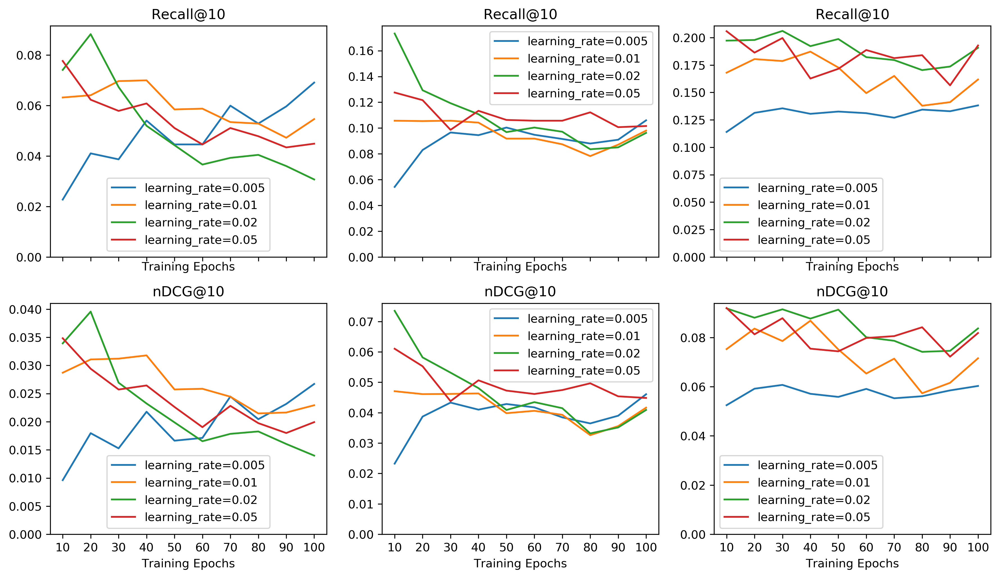

In [23]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_convergence_fm.group_evaluations["partition"]
frappe_convergence_fm_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_convergence_fm_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()

frappe_convergence_fm_fig.show()

### AFM comparison

In [ ]:
frappe_convergence_afm = EvaluatePartition("../partitioned_data/frappe/partition_1/")

In [ ]:
for f in ["64", "128", "256"]:
    for l in ["005", "01", "02", "05"]:
        for e in ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"]:
            frappe_convergence_afm.add_evaluation(
                frappe_file("AFM/F{0}L{1}/AFM_F{0}L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="AFM", model_params="F{0}L{1}B256R001".format(f, l))

In [24]:
frappe_convergence_afm.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.000590,0.005905,0.001074,0.021467,0.005323,0.002755,0.002513,0.001795,56.296076,0.0,1.0,1.0,0.751698,10,AFM,F64L005B256R001
1,0.001831,0.018305,0.003328,0.025135,0.009836,0.006801,0.004230,0.003410,51.819121,0.0,1.0,1.0,0.771479,20,AFM,F64L005B256R001
2,0.000620,0.006200,0.001127,0.012967,0.004770,0.002352,0.001864,0.001224,63.415748,0.0,1.0,1.0,0.812518,30,AFM,F64L005B256R001
3,0.000266,0.002657,0.000483,0.007228,0.002544,0.001257,0.001212,0.000850,63.441341,0.0,1.0,1.0,0.894302,40,AFM,F64L005B256R001
4,0.000266,0.002657,0.000483,0.005434,0.002078,0.001029,0.000835,0.000545,66.066879,0.0,1.0,1.0,0.907293,50,AFM,F64L005B256R001
5,0.000266,0.002657,0.000483,0.004887,0.001942,0.001273,0.001043,0.000861,69.119718,0.0,1.0,1.0,0.916150,60,AFM,F64L005B256R001
6,0.000236,0.002362,0.000429,0.003982,0.001605,0.001102,0.000852,0.000725,66.666667,0.0,1.0,1.0,0.929141,70,AFM,F64L005B256R001
7,0.000295,0.002952,0.000537,0.003665,0.001976,0.001453,0.001151,0.001007,72.418182,0.0,1.0,1.0,0.902569,80,AFM,F64L005B256R001
8,0.000266,0.002657,0.000483,0.004346,0.001621,0.001274,0.000948,0.000866,70.975069,0.0,1.0,1.0,0.893416,90,AFM,F64L005B256R001
9,0.000236,0.002362,0.000429,0.003946,0.001493,0.000966,0.000694,0.000547,69.975000,0.0,1.0,1.0,0.905521,100,AFM,F64L005B256R001


#### Ploting metrics

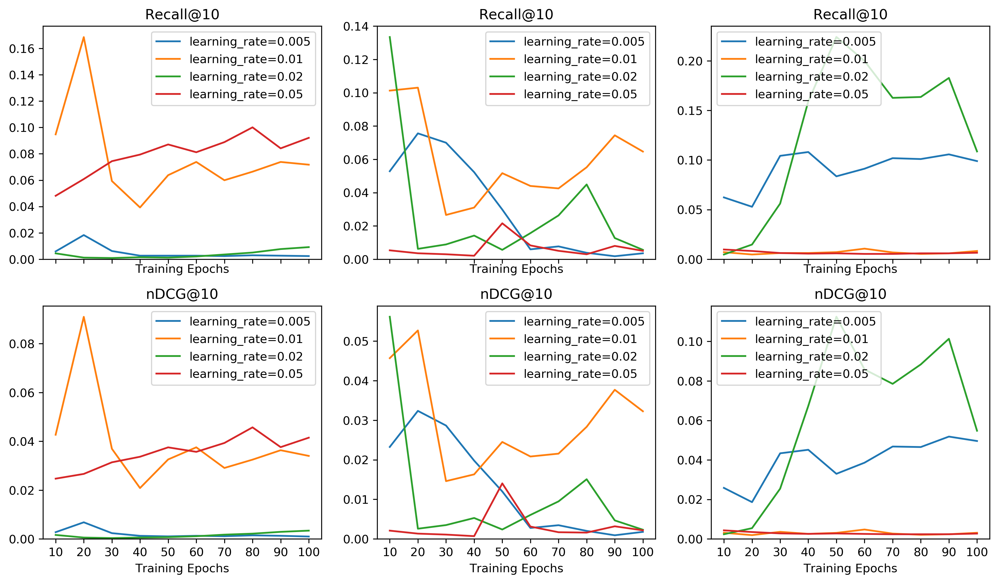

In [25]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_convergence_afm.group_evaluations["partition"]
frappe_convergence_afm_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_convergence_afm_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()

frappe_convergence_afm_fig.show()

### AFMpretrained comparison

In [30]:
frappe_convergence_afm_pretrained = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [31]:
for f in ["64", "128", "256"]:
    for l in ["005", "01", "02", "05"]:
        for e in ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"]:
            frappe_convergence_afm_pretrained.add_evaluation(
                frappe_file("AFMpretrained/F{0}L{1}/AFMpretrained_F{0}L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="AFMpretrained", model_params="F{0}L{1}B256R001".format(f, l))

In [32]:
frappe_convergence_afm_pretrained.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.034898,0.348981,0.063451,0.224882,0.201046,0.185301,0.139216,0.134974,20.488995,0.0,1.0,1.0,0.382935,10,AFMpretrained,F64L005B256R001
1,0.034928,0.349277,0.063505,0.228050,0.204054,0.188322,0.143053,0.138784,20.561605,0.0,1.0,1.0,0.381754,20,AFMpretrained,F64L005B256R001
2,0.034928,0.349277,0.063505,0.229475,0.205660,0.189931,0.145222,0.140954,20.569517,0.0,1.0,1.0,0.382049,30,AFMpretrained,F64L005B256R001
3,0.034928,0.349277,0.063505,0.229369,0.205571,0.189841,0.145082,0.140813,21.102990,0.0,1.0,1.0,0.377916,40,AFMpretrained,F64L005B256R001
4,0.034928,0.349277,0.063505,0.228871,0.205691,0.189284,0.144564,0.140144,20.996673,0.0,1.0,1.0,0.378801,50,AFMpretrained,F64L005B256R001
5,0.034928,0.349277,0.063505,0.229923,0.206586,0.190436,0.146087,0.141717,20.997148,0.0,1.0,1.0,0.378801,60,AFMpretrained,F64L005B256R001
6,0.034928,0.349277,0.063505,0.229071,0.205642,0.189484,0.144801,0.140425,21.004278,0.0,1.0,1.0,0.378801,70,AFMpretrained,F64L005B256R001
7,0.034928,0.349277,0.063505,0.228204,0.204733,0.188570,0.143545,0.139165,21.016635,0.0,1.0,1.0,0.378801,80,AFMpretrained,F64L005B256R001
8,0.034928,0.349277,0.063505,0.227529,0.204050,0.187882,0.142628,0.138244,21.082621,0.0,1.0,1.0,0.378211,90,AFMpretrained,F64L005B256R001
9,0.034928,0.349277,0.063505,0.228463,0.204976,0.188777,0.143863,0.139457,20.902474,0.0,1.0,1.0,0.379392,100,AFMpretrained,F64L005B256R001


#### Ploting metrics

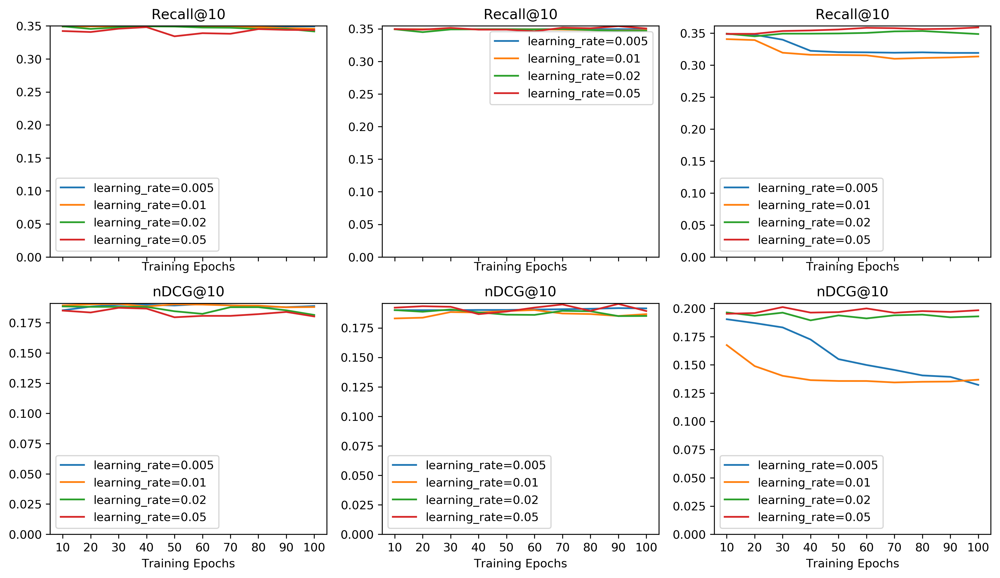

In [33]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_convergence_afm_pretrained.group_evaluations["partition"]
frappe_convergence_afm_pretrained_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_convergence_afm_pretrained_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()

frappe_convergence_afm_pretrained_fig.show()

### NFM comparison

In [38]:
frappe_convergence_nfm = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [39]:
for f in ["64", "128", "256"]:
    for l in ["005", "01", "02", "05"]:
        for e in ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"]:
            frappe_convergence_nfm.add_evaluation(
                frappe_file("NFM/F{0}L{1}/NFM_F{0}L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="NFM", model_params="F{0}L{1}B256R001".format(f, l))

In [65]:
for epoch in range(10, 100 + 1, 10):
    frappe_convergence_nfm.add_evaluation(
        frappe_file("NFM/F256L005B256R001BND03/NFM_F{0}L{1}B256E{2}R001.tsv".format(256, str(0.005)[2:], epoch)),
        "partition", partition=str(epoch), algorithm="NFM", model_params="F256L005B256R001BND03")

In [81]:
for epoch in range(10, 100 + 1, 10):
    frappe_convergence_nfm.add_evaluation(
        frappe_file("NFM/F256L005B256R001D03N2BN/NFM_F{0}L{1}B256E{2}R001.tsv".format(256, str(0.005)[2:], epoch)),
        "partition", partition=str(epoch), algorithm="NFM", model_params="F256L005B256R001D03N2BN")

In [82]:
frappe_convergence_nfm.group_evaluations["partition"].dtypes

precision_at_10             float64
recall_at_10                float64
f1_score_at_10              float64
ndcg_at_50                  float64
ndcg_at_20                  float64
ndcg_at_10                  float64
map_at_20                   float64
map_at_10                   float64
mean_ranks                  float64
user_coverage               float64
event_coverage_at_10        float64
event_coverage_at_20        float64
perc_user_events_rank_NA    float64
partition                    object
algorithm                    object
model_params                 object
dtype: object

#### Ploting metrics

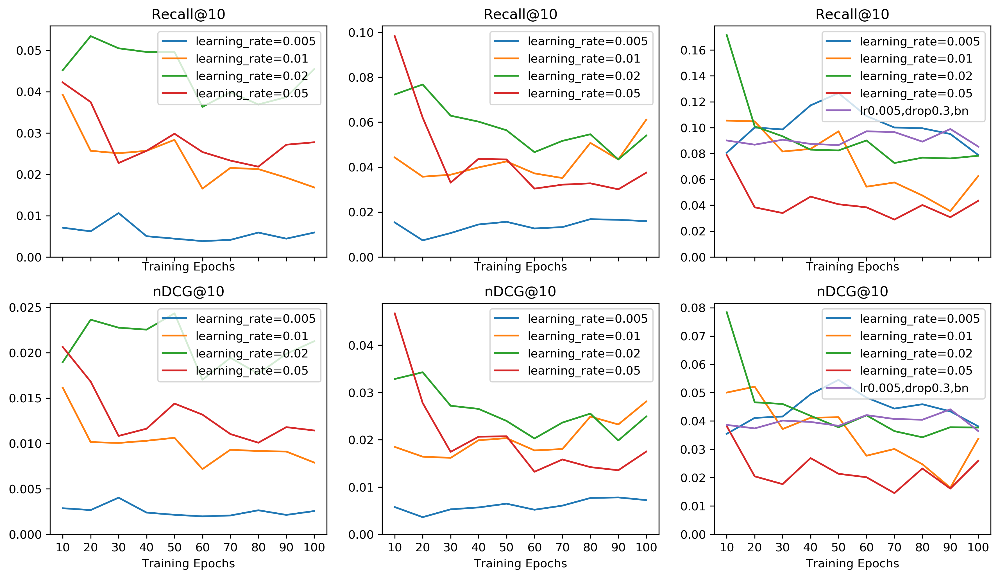

In [83]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_convergence_nfm.group_evaluations["partition"]
frappe_convergence_nfm_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_convergence_nfm_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()

# ax_recall_ndcg[0, 2].plot(dataframe.loc[dataframe["model_params"] == "F256L005B256R001BND03", "partition"],
#                           dataframe.loc[dataframe["model_params"] == "F256L005B256R001BND03", "recall_at_10"],
#                           label="lr0.005,drop0.3,bn")
ax_recall_ndcg[0, 2].plot(dataframe.loc[dataframe["model_params"] == "F256L005B256R001D03N2BN", "partition"],
                          dataframe.loc[dataframe["model_params"] == "F256L005B256R001D03N2BN", "recall_at_10"],
                          label="lr0.005,drop0.3,bn")
ax_recall_ndcg[0, 2].legend()
# ax_recall_ndcg[1, 2].plot(dataframe.loc[dataframe["model_params"] == "F256L005B256R001BND03", "partition"],
#                           dataframe.loc[dataframe["model_params"] == "F256L005B256R001BND03", "ndcg_at_10"],
#                           label="lr0.005,drop0.3,bn")
ax_recall_ndcg[1, 2].plot(dataframe.loc[dataframe["model_params"] == "F256L005B256R001D03N2BN", "partition"],
                          dataframe.loc[dataframe["model_params"] == "F256L005B256R001D03N2BN", "ndcg_at_10"],
                          label="lr0.005,drop0.3,bn")
ax_recall_ndcg[1, 2].legend()
    
frappe_convergence_nfm_fig.show()

### FM (IFM bundled version, with Batch Normalization) performance

In [34]:
frappe_convergence_fm_ifm = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [35]:
for f in ["64", "128", "256"]:
    for l in ["005", "01", "02", "05"]: 
        for e in ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"]:
            frappe_convergence_fm_ifm.add_evaluation(
                frappe_file("FMifm/F{0}L{1}B256R001/FMifm_F{0}L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="FMifm", model_params="F{0}L{1}B256R001".format(f, l))

In [36]:
frappe_convergence_fm_ifm.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.000148,0.001476,0.000268,0.002467,0.000902,0.000455,0.000297,0.000175,61.398230,0.0,1.0,1.0,0.966637,10,FMifm,F64L005B256R001
1,0.000177,0.001771,0.000322,0.003669,0.001315,0.000875,0.000732,0.000615,58.760870,0.0,1.0,1.0,0.959256,20,FMifm,F64L005B256R001
2,0.000236,0.002362,0.000429,0.004351,0.001702,0.001261,0.001035,0.000918,62.296875,0.0,1.0,1.0,0.943313,30,FMifm,F64L005B256R001
3,0.000266,0.002657,0.000483,0.005196,0.002458,0.001576,0.001467,0.001233,62.281250,0.0,1.0,1.0,0.933865,40,FMifm,F64L005B256R001
4,0.000236,0.002362,0.000429,0.005272,0.001782,0.001273,0.001084,0.000951,60.367647,0.0,1.0,1.0,0.939770,50,FMifm,F64L005B256R001
5,0.000266,0.002657,0.000483,0.005901,0.002256,0.001441,0.001291,0.001071,60.325688,0.0,1.0,1.0,0.935636,60,FMifm,F64L005B256R001
6,0.000325,0.003248,0.000590,0.005504,0.002603,0.001757,0.001523,0.001316,58.828571,0.0,1.0,1.0,0.937998,70,FMifm,F64L005B256R001
7,0.000325,0.003248,0.000590,0.005924,0.002526,0.001658,0.001414,0.001190,57.840909,0.0,1.0,1.0,0.935046,80,FMifm,F64L005B256R001
8,0.000325,0.003248,0.000590,0.006079,0.002295,0.001351,0.001045,0.000800,59.341991,0.0,1.0,1.0,0.931798,90,FMifm,F64L005B256R001
9,0.000354,0.003543,0.000644,0.005424,0.002450,0.001658,0.001314,0.001112,60.842593,0.0,1.0,1.0,0.936227,100,FMifm,F64L005B256R001


#### Ploting metrics

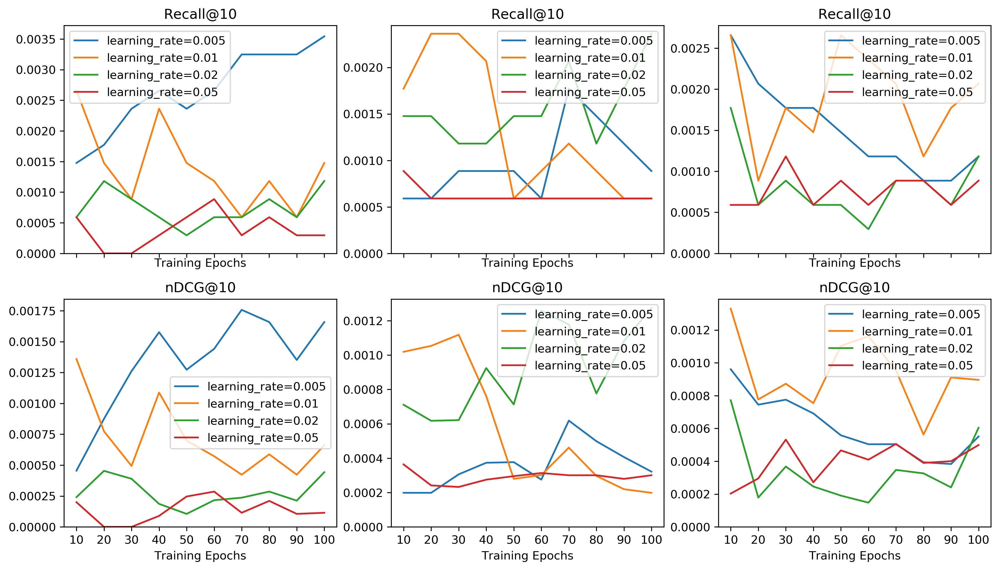

In [37]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_convergence_fm_ifm.group_evaluations["partition"]
frappe_convergence_fm_ifm_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_convergence_fm_ifm_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()

frappe_convergence_fm_ifm_fig.show()

### IFM comparison

#### KF=8

In [42]:
frappe_convergence_ifm_kf8 = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [43]:
for f in ["64", "128", "256"]:
    for l in ["005", "01", "02", "05"]:
        for e in ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"]:
            frappe_convergence_ifm_kf8.add_evaluation(
                frappe_file("IFM/KF8B256R001/F{0}KF8L{1}B256R001/IFM_F{0}KF8L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="IFM", model_params="F{0}L{1}B256R001".format(f, l))

In [78]:
for e in [str(e) for e in range(10, 100 + 1, 10)]:
    f = 256
    l = "01"
    frappe_convergence_ifm_kf8.add_evaluation(
                frappe_file("IFM/KF8B256R001/F{0}KF8L{1}B256R001D08BN/IFM_F{0}KF8L{1}B256E{2}R001D08BN.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="IFM", model_params="F{0}L{1}B256R001D08BN".format(f, l))

In [79]:
frappe_convergence_ifm_kf8.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.000207,0.002067,0.000376,0.003631,0.001696,0.000968,0.000832,0.000642,52.179245,0.0,1.0,1.0,0.968704,10,IFM,F64L005B256R001
1,0.000236,0.002362,0.000429,0.003895,0.002069,0.001102,0.000992,0.000729,50.901961,0.0,1.0,1.0,0.969885,20,IFM,F64L005B256R001
2,0.000118,0.001181,0.000215,0.003290,0.001526,0.000626,0.000709,0.000460,50.108696,0.0,1.0,1.0,0.972837,30,IFM,F64L005B256R001
3,0.000295,0.002952,0.000537,0.003527,0.001960,0.001456,0.001133,0.001005,49.866667,0.0,1.0,1.0,0.973428,40,IFM,F64L005B256R001
4,0.000148,0.001476,0.000268,0.003270,0.001383,0.000720,0.000677,0.000500,52.645833,0.0,1.0,1.0,0.971656,50,IFM,F64L005B256R001
5,0.000148,0.001476,0.000268,0.003096,0.001491,0.000834,0.000805,0.000633,56.730000,0.0,1.0,1.0,0.970475,60,IFM,F64L005B256R001
6,0.000207,0.002067,0.000376,0.003510,0.001432,0.000976,0.000783,0.000654,53.697917,0.0,1.0,1.0,0.971656,70,IFM,F64L005B256R001
7,0.000384,0.003838,0.000698,0.003763,0.002221,0.001769,0.001269,0.001143,48.034884,0.0,1.0,1.0,0.974609,80,IFM,F64L005B256R001
8,0.000325,0.003248,0.000590,0.003913,0.002411,0.001486,0.001217,0.000948,44.734940,0.0,1.0,1.0,0.975495,90,IFM,F64L005B256R001
9,0.000177,0.001771,0.000322,0.002865,0.001245,0.000656,0.000485,0.000328,48.734177,0.0,1.0,1.0,0.976676,100,IFM,F64L005B256R001


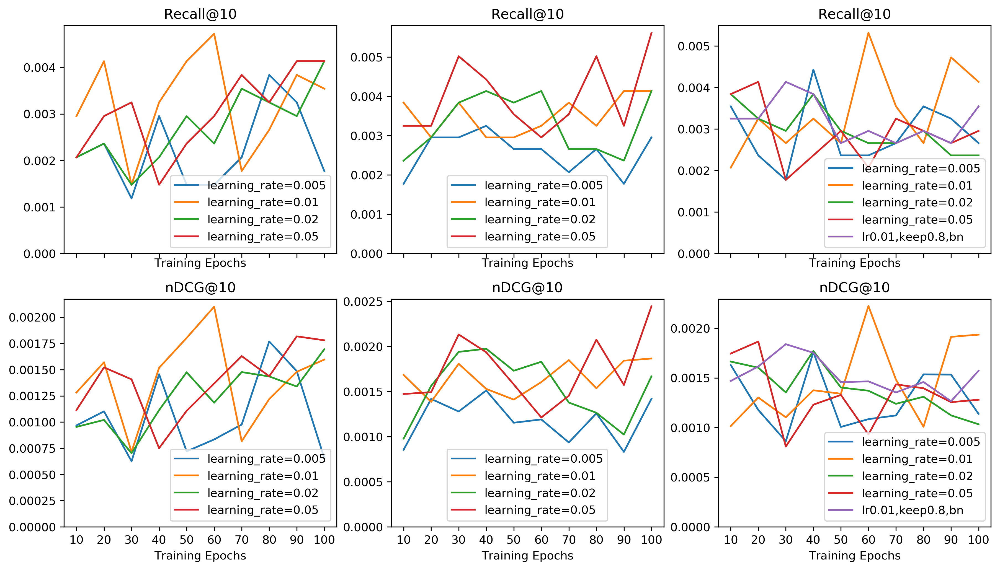

In [80]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_convergence_ifm_kf8.group_evaluations["partition"]
frappe_convergence_ifm_kf8_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_convergence_ifm_kf8_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()

ax_recall_ndcg[0, 2].plot(dataframe.loc[dataframe["model_params"] == "F256L01B256R001D08BN", "partition"],
                          dataframe.loc[dataframe["model_params"] == "F256L01B256R001D08BN", "recall_at_10"],
                          label="lr0.01,keep0.8,bn")
ax_recall_ndcg[0, 2].legend()
ax_recall_ndcg[1, 2].plot(dataframe.loc[dataframe["model_params"] == "F256L01B256R001D08BN", "partition"],
                          dataframe.loc[dataframe["model_params"] == "F256L01B256R001D08BN", "ndcg_at_10"],
                          label="lr0.01,keep0.8,bn")
ax_recall_ndcg[1, 2].legend()
    
frappe_convergence_ifm_kf8_fig.show()

#### KF=16

In [46]:
frappe_convergence_ifm_kf16 = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [47]:
for f in ["64", "128", "256"]:
    for l in ["005", "01", "02", "05"]:
        for e in ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"]:
            frappe_convergence_ifm_kf16.add_evaluation(
                frappe_file("IFM/KF16B256R001/F{0}KF16L{1}B256R001/IFM_F{0}KF16L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="IFM", model_params="F{0}L{1}B256R001".format(f, l))

In [48]:
frappe_convergence_ifm_kf16.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.000207,0.002067,0.000376,0.003527,0.002018,0.000918,0.000883,0.000592,52.076923,0.0,1.0,1.0,0.969294,10,IFM,F64L005B256R001
1,0.000413,0.004133,0.000752,0.003994,0.002408,0.001680,0.001168,0.000977,49.811881,0.0,1.0,1.0,0.970180,20,IFM,F64L005B256R001
2,0.000325,0.003248,0.000590,0.003996,0.001976,0.001390,0.001000,0.000845,48.551020,0.0,1.0,1.0,0.971066,30,IFM,F64L005B256R001
3,0.000443,0.004429,0.000805,0.003938,0.002443,0.001794,0.001194,0.001028,45.550562,0.0,1.0,1.0,0.973723,40,IFM,F64L005B256R001
4,0.000413,0.004133,0.000752,0.003918,0.002178,0.001748,0.001153,0.001044,47.511111,0.0,1.0,1.0,0.973428,50,IFM,F64L005B256R001
5,0.000207,0.002067,0.000376,0.003565,0.001607,0.000951,0.000792,0.000621,46.920455,0.0,1.0,1.0,0.974018,60,IFM,F64L005B256R001
6,0.000236,0.002362,0.000429,0.003384,0.001833,0.001034,0.000857,0.000650,48.318681,0.0,1.0,1.0,0.973133,70,IFM,F64L005B256R001
7,0.000207,0.002067,0.000376,0.003388,0.001363,0.000924,0.000709,0.000593,52.989899,0.0,1.0,1.0,0.970771,80,IFM,F64L005B256R001
8,0.000354,0.003543,0.000644,0.004180,0.002178,0.001725,0.001297,0.001171,52.386792,0.0,1.0,1.0,0.968704,90,IFM,F64L005B256R001
9,0.000384,0.003838,0.000698,0.004147,0.002073,0.001459,0.000965,0.000788,48.884615,0.0,1.0,1.0,0.969294,100,IFM,F64L005B256R001


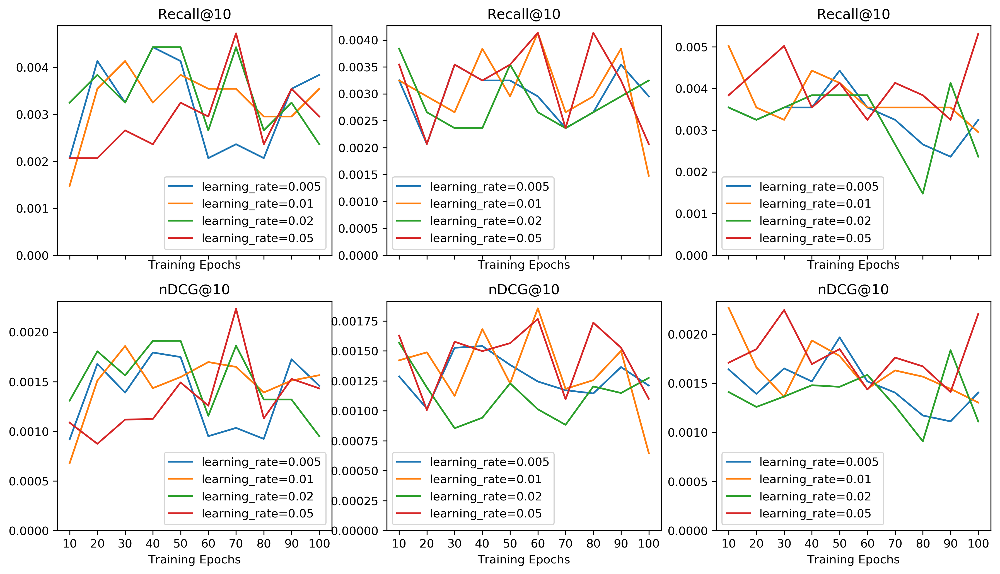

In [49]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_convergence_ifm_kf16.group_evaluations["partition"]
frappe_convergence_ifm_kf16_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_convergence_ifm_kf16_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()

frappe_convergence_ifm_kf16_fig.show()

#### KF=24

In [50]:
frappe_convergence_ifm_kf24 = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [51]:
for f in ["64", "128", "256"]:
    for l in ["005", "01", "02", "05"]:
        for e in ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"]:
            frappe_convergence_ifm_kf24.add_evaluation(
                frappe_file("IFM/KF24B256R001/F{0}KF24L{1}B256R001/IFM_F{0}KF24L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="IFM", model_params="F{0}L{1}B256R001".format(f, l))

In [52]:
frappe_convergence_ifm_kf24.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.000207,0.002067,0.000376,0.003957,0.001796,0.001078,0.000958,0.000776,52.904762,0.0,1.0,1.0,0.968999,10,IFM,F64L005B256R001
1,0.000177,0.001771,0.000322,0.003474,0.001619,0.000833,0.000754,0.000556,49.721649,0.0,1.0,1.0,0.971361,20,IFM,F64L005B256R001
2,0.000502,0.005019,0.000913,0.004076,0.002524,0.002058,0.001327,0.001189,49.202020,0.0,1.0,1.0,0.970771,30,IFM,F64L005B256R001
3,0.000207,0.002067,0.000376,0.003911,0.001671,0.000985,0.000859,0.000663,47.893617,0.0,1.0,1.0,0.972247,40,IFM,F64L005B256R001
4,0.000295,0.002952,0.000537,0.004313,0.002343,0.001210,0.001029,0.000710,43.100000,0.0,1.0,1.0,0.973428,50,IFM,F64L005B256R001
5,0.000266,0.002657,0.000483,0.003597,0.001635,0.001190,0.000881,0.000761,47.355556,0.0,1.0,1.0,0.973428,60,IFM,F64L005B256R001
6,0.000148,0.001476,0.000268,0.003598,0.001460,0.000875,0.000835,0.000682,50.378947,0.0,1.0,1.0,0.971952,70,IFM,F64L005B256R001
7,0.000207,0.002067,0.000376,0.003524,0.001605,0.000917,0.000781,0.000583,49.587629,0.0,1.0,1.0,0.971361,80,IFM,F64L005B256R001
8,0.000325,0.003248,0.000590,0.003858,0.002232,0.001359,0.001041,0.000813,46.053763,0.0,1.0,1.0,0.972542,90,IFM,F64L005B256R001
9,0.000236,0.002362,0.000429,0.003461,0.001330,0.000963,0.000669,0.000572,45.471264,0.0,1.0,1.0,0.974314,100,IFM,F64L005B256R001


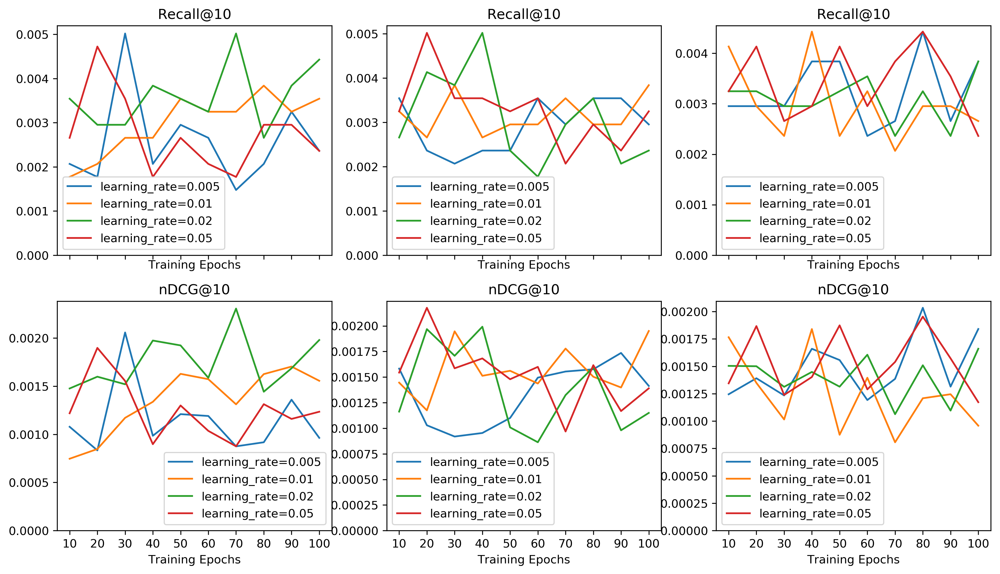

In [53]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_convergence_ifm_kf24.group_evaluations["partition"]
frappe_convergence_ifm_kf24_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_convergence_ifm_kf24_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()

frappe_convergence_ifm_kf24_fig.show()

#### KF=32

In [54]:
frappe_convergence_ifm_kf32 = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [55]:
for f in ["64", "128", "256"]:
    for l in ["005", "01", "02", "05"]:
        for e in ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"]:
            frappe_convergence_ifm_kf32.add_evaluation(
                frappe_file("IFM/KF32B256R001/F{0}KF32L{1}B256R001/IFM_F{0}KF32L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="IFM", model_params="F{0}L{1}B256R001".format(f, l))

In [56]:
frappe_convergence_ifm_kf32.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.000266,0.002657,0.000483,0.003856,0.002103,0.001209,0.001023,0.000779,49.766990,0.0,1.0,1.0,0.969590,10,IFM,F64L005B256R001
1,0.000354,0.003543,0.000644,0.003836,0.001991,0.001542,0.001070,0.000947,51.058824,0.0,1.0,1.0,0.969885,20,IFM,F64L005B256R001
2,0.000266,0.002657,0.000483,0.003907,0.001832,0.001225,0.000969,0.000797,48.250000,0.0,1.0,1.0,0.971656,30,IFM,F64L005B256R001
3,0.000295,0.002952,0.000537,0.003846,0.002029,0.001238,0.000939,0.000738,46.860215,0.0,1.0,1.0,0.972542,40,IFM,F64L005B256R001
4,0.000089,0.000886,0.000161,0.003472,0.001400,0.000557,0.000696,0.000453,49.413043,0.0,1.0,1.0,0.972837,50,IFM,F64L005B256R001
5,0.000295,0.002952,0.000537,0.003704,0.001774,0.001196,0.000848,0.000700,44.517241,0.0,1.0,1.0,0.974314,60,IFM,F64L005B256R001
6,0.000148,0.001476,0.000268,0.003527,0.001537,0.000740,0.000726,0.000519,47.426966,0.0,1.0,1.0,0.973723,70,IFM,F64L005B256R001
7,0.000295,0.002952,0.000537,0.003230,0.001502,0.001197,0.000786,0.000699,55.333333,0.0,1.0,1.0,0.968999,80,IFM,F64L005B256R001
8,0.000354,0.003543,0.000644,0.003538,0.001703,0.001406,0.000878,0.000797,56.415929,0.0,1.0,1.0,0.966637,90,IFM,F64L005B256R001
9,0.000236,0.002362,0.000429,0.003396,0.001715,0.001007,0.000795,0.000621,57.405172,0.0,1.0,1.0,0.965751,100,IFM,F64L005B256R001


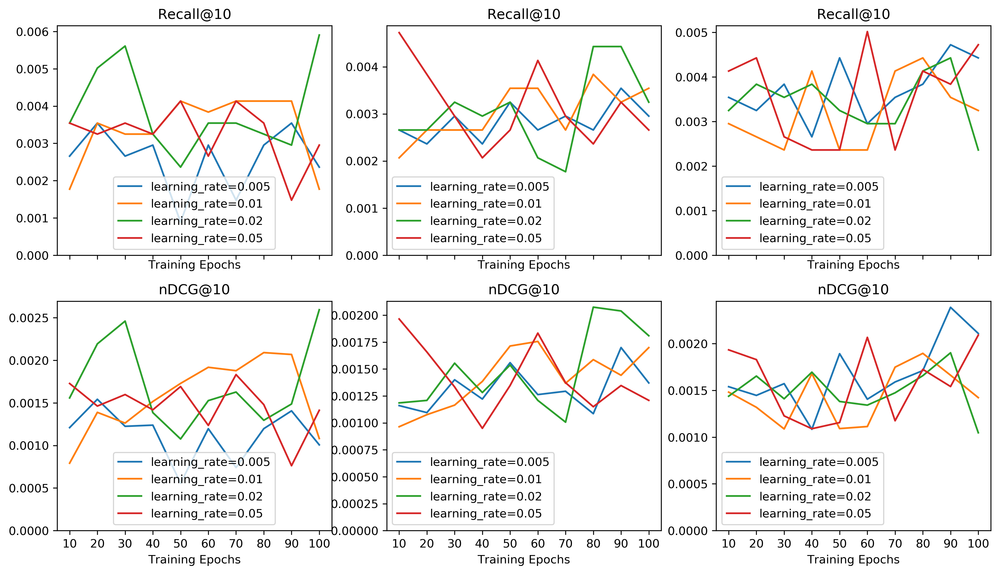

In [57]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_convergence_ifm_kf32.group_evaluations["partition"]
frappe_convergence_ifm_kf32_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_convergence_ifm_kf32_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()

frappe_convergence_ifm_kf32_fig.show()

### CFM comparison

In [117]:
frappe_convergence_cfm = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [118]:
for l in [str(l)[2:] for l in [0.05]]:
    for e in range(10, 100 + 1, 10):
        frappe_convergence_cfm.add_evaluation(
            frappe_file("CFM/F64A32C32L{0}B256R001/CFM_F64A32C32L{0}B256E{1}R001.tsv".format(l, e)),
            "partition", partition=e, algorithm="CFM", model_params="F64A32C32L{0}B256R001".format(l))

In [119]:
frappe_convergence_cfm.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.000325,0.003248,0.00059,0.004124,0.002167,0.00143,0.001095,0.000898,50.158879,0.0,1.0,1.0,0.968409,10,CFM,F64A32C32L05B256R001
1,0.000325,0.003248,0.00059,0.004124,0.002167,0.00143,0.001095,0.000898,49.981132,0.0,1.0,1.0,0.968704,20,CFM,F64A32C32L05B256R001
2,0.000325,0.003248,0.00059,0.004124,0.002167,0.00143,0.001095,0.000898,50.066038,0.0,1.0,1.0,0.968704,30,CFM,F64A32C32L05B256R001
3,0.000325,0.003248,0.00059,0.004124,0.002167,0.00143,0.001095,0.000898,50.448598,0.0,1.0,1.0,0.968409,40,CFM,F64A32C32L05B256R001
4,0.000325,0.003248,0.00059,0.004124,0.002167,0.00143,0.001095,0.000898,49.990566,0.0,1.0,1.0,0.968704,50,CFM,F64A32C32L05B256R001
5,0.000325,0.003248,0.00059,0.004124,0.002167,0.00143,0.001095,0.000898,50.373832,0.0,1.0,1.0,0.968409,60,CFM,F64A32C32L05B256R001
6,0.000325,0.003248,0.00059,0.004124,0.002167,0.00143,0.001095,0.000898,50.392523,0.0,1.0,1.0,0.968409,70,CFM,F64A32C32L05B256R001
7,0.000325,0.003248,0.00059,0.004124,0.002167,0.00143,0.001095,0.000898,50.861111,0.0,1.0,1.0,0.968113,80,CFM,F64A32C32L05B256R001
8,0.000325,0.003248,0.00059,0.004124,0.002167,0.00143,0.001095,0.000898,50.759259,0.0,1.0,1.0,0.968113,90,CFM,F64A32C32L05B256R001
9,0.000325,0.003248,0.00059,0.004124,0.002167,0.00143,0.001095,0.000898,50.364486,0.0,1.0,1.0,0.968409,100,CFM,F64A32C32L05B256R001


### Final selected models

In [58]:
def select_results(df_metrics, model_params, algorithm=None, partition=None):
    index = (df_metrics["model_params"] == model_params)
    if algorithm is not None:
        index = (df_metrics["algorithm"] == algorithm) & index
    if partition is not None:
        index = index & (df_metrics["partition"] == partition)
    return df_metrics.loc[index, :]


In [64]:
frappe_results = pd.concat([select_results(frappe_convergence_fm.group_evaluations["partition"],
                                           "F256L02B256R001", partition="100"),
                            select_results(frappe_convergence_nfm.group_evaluations["partition"],
                                           "F256L005B256R001", partition="50"),
                            select_results(frappe_convergence_afm_pretrained.group_evaluations["partition"],
                                           "F256L05B256R001", partition="100")
                           ], ignore_index=True)
frappe_results

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.019073,0.190729,0.034678,0.199570,0.132866,0.083686,0.065224,0.052042,30.165336,0.0,1.0,1.0,0.112489,100,FM,F256L02B256R001
1,0.012666,0.126661,0.023029,0.137067,0.085182,0.054515,0.041709,0.033417,36.613853,0.0,1.0,1.0,0.288161,50,NFM,F256L005B256R001
2,0.035902,0.359020,0.065276,0.241630,0.219609,0.198351,0.154133,0.148191,19.739964,0.0,1.0,1.0,0.352820,100,AFMpretrained,F256L05B256R001


## Meetup-Chicago dataset results

In [23]:
def meetup_file(*args):
    return os.path.join("../experiments/meetup", *args)

### Factorization Machines

In [24]:
meetup_fm = EvaluatePartition("../data/meetup/")

users: 11233, events: 6538


In [29]:
for f in [64]:
    for l in [str(l)[2:] for l in [0.005, 0.01, 0.02, 0.05]]:
        result_dir = "FM/F{0}L{1}B256R001".format(f, l)
        with elapsed_timer("{0}s - %s" % (result_dir,)):
            for e in [str(e) for e in range(10, 100 + 1, 10)]:
                meetup_fm.add_evaluation(
                    meetup_file(os.path.join(result_dir, "FM_F{0}L{1}B256E{2}R001.tsv".format(f, l, e))),
                    "partition", partition=e, algorithm="FM", model_params="F{0}L{1}B256R001".format(f, l))


1135.6269447803497s - FM/F64L005B256R001
1164.3320457935333s - FM/F64L01B256R001
1182.6818993091583s - FM/F64L02B256R001
1178.0590500831604s - FM/F64L05B256R001


In [30]:
for f in [128]:
    for l in [str(l)[2:] for l in [0.005]]:
        result_dir = "FM/F{0}L{1}B256R001".format(f, l)
        with elapsed_timer("{0}s - %s" % (result_dir,)):
            for e in [str(e) for e in range(10, 100 + 1, 10)]:
                meetup_fm.add_evaluation(
                    meetup_file(os.path.join(result_dir, "FM_F{0}L{1}B256E{2}R001.tsv".format(f, l, e))),
                    "partition", partition=e, algorithm="FM", model_params="F{0}L{1}B256R001".format(f, l))


1158.3326840400696s - FM/F128L005B256R001


In [35]:
for f in [128]:
    for l in [str(l)[2:] for l in [0.01, 0.02, 0.05]]:
        result_dir = "FM/F{0}L{1}B256R001".format(f, l)
        with elapsed_timer("{0}s - %s" % (result_dir,)):
            for e in [str(e) for e in range(10, 100 + 1, 10)]:
                meetup_fm.add_evaluation(
                    meetup_file(os.path.join(result_dir, "FM_F{0}L{1}B256E{2}R001.tsv".format(f, l, e))),
                    "partition", partition=e, algorithm="FM", model_params="F{0}L{1}B256R001".format(f, l))


1186.4852542877197s - FM/F128L01B256R001
1221.0668082237244s - FM/F128L02B256R001
1214.0773215293884s - FM/F128L05B256R001


In [36]:
for f in [256]:
    for l in [str(l)[2:] for l in [0.005, 0.01, 0.02, 0.05]]:
        result_dir = "FM/F{0}L{1}B256R001".format(f, l)
        with elapsed_timer("{0}s - %s" % (result_dir,)):
            for e in [str(e) for e in range(10, 100 + 1, 10)]:
                meetup_fm.add_evaluation(
                    meetup_file(os.path.join(result_dir, "FM_F{0}L{1}B256E{2}R001.tsv".format(f, l, e))),
                    "partition", partition=e, algorithm="FM", model_params="F{0}L{1}B256R001".format(f, l))

1206.9751980304718s - FM/F256L005B256R001
1215.0592448711395s - FM/F256L01B256R001
1203.4252552986145s - FM/F256L02B256R001
1179.3299887180328s - FM/F256L05B256R001


In [37]:
meetup_fm.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.045215,0.152698,0.069770,0.142076,0.125044,0.111544,0.088291,0.084019,24.081035,0.0,0.780973,0.836494,0.604684,10,FM,F64L005B256R001
1,0.058266,0.204274,0.090670,0.180123,0.161194,0.145854,0.114936,0.109957,21.743447,0.0,0.780973,0.836494,0.539876,20,FM,F64L005B256R001
2,0.064551,0.232502,0.101047,0.197859,0.179197,0.161980,0.127179,0.121516,20.987404,0.0,0.782196,0.835883,0.508650,30,FM,F64L005B256R001
3,0.068014,0.248197,0.106770,0.212013,0.192807,0.175368,0.138904,0.133212,20.884541,0.0,0.783114,0.835730,0.487728,40,FM,F64L005B256R001
4,0.070204,0.260039,0.110560,0.221941,0.201557,0.183208,0.145133,0.139105,20.362347,0.0,0.782808,0.836035,0.474400,50,FM,F64L005B256R001
5,0.072234,0.270670,0.114035,0.230587,0.210323,0.191635,0.152433,0.146304,20.140330,0.0,0.783420,0.835271,0.465258,60,FM,F64L005B256R001
6,0.073809,0.279155,0.116750,0.236755,0.216257,0.197619,0.157076,0.151029,19.928650,0.0,0.783420,0.835271,0.458366,70,FM,F64L005B256R001
7,0.074886,0.285785,0.118675,0.241695,0.221152,0.202377,0.161102,0.155005,19.652697,0.0,0.783573,0.835883,0.453759,80,FM,F64L005B256R001
8,0.074976,0.285608,0.118772,0.244054,0.223039,0.203496,0.162605,0.156231,19.650713,0.0,0.783420,0.835118,0.450418,90,FM,F64L005B256R001
9,0.076142,0.291676,0.120759,0.249232,0.227697,0.208423,0.167010,0.160776,19.309019,0.0,0.782655,0.835883,0.447535,100,FM,F64L005B256R001


#### Ploting metrics

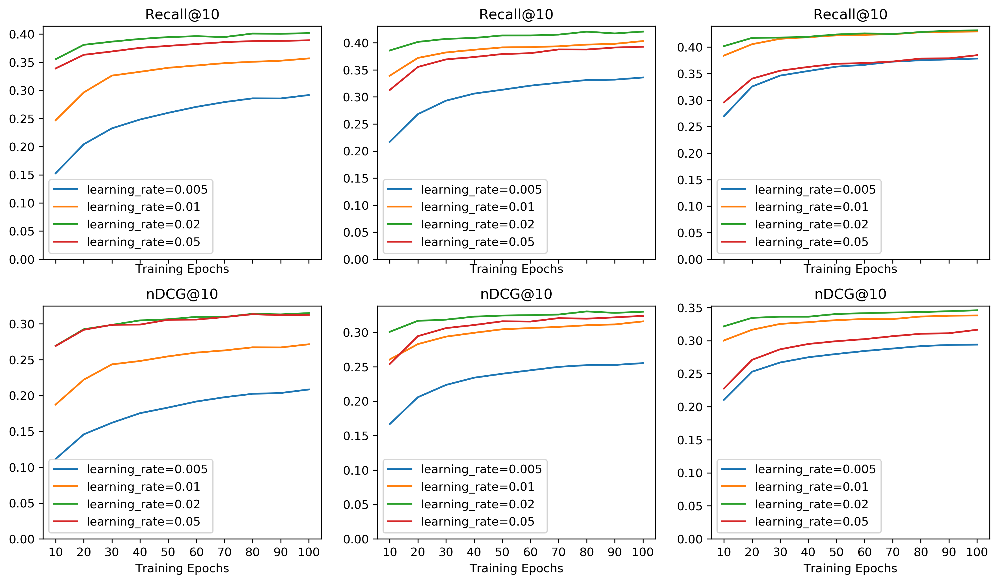

In [38]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = meetup_fm.group_evaluations["partition"]
meetup_fm_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = meetup_fm_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()
    
meetup_fm_fig.show()

### Attentional Factorization Machines

In [25]:
meetup_afm = EvaluatePartition("../data/meetup/")

users: 11233, events: 6538


In [27]:
import time

for f in [64, 128, 256]:
    for l in [str(l)[2:] for l in [0.005, 0.01, 0.02, 0.05]]:
        result_dir = "AFM/F{0}L{1}B256R001".format(f, l)
        with elapsed_timer("{0}s - %s" % (result_dir,)):
            for e in [str(e) for e in range(10, 100 + 1, 10)]:
                meetup_afm.add_evaluation(
                    meetup_file(os.path.join(result_dir, "AFM_F{0}L{1}B256E{2}R001.tsv".format(f, l, e))),
                    "partition", partition=e, algorithm="AFM", model_params="F{0}L{1}B256R001".format(f, l))


1055.07559132576s - AFM/F64L005B256R001
1071.8636858463287s - AFM/F64L01B256R001
1076.3679704666138s - AFM/F64L02B256R001
1076.0667161941528s - AFM/F64L05B256R001
1075.2441763877869s - AFM/F128L005B256R001
1077.2582142353058s - AFM/F128L01B256R001
1081.2148640155792s - AFM/F128L02B256R001
1072.1006650924683s - AFM/F128L05B256R001
1074.7295565605164s - AFM/F256L005B256R001
1090.5182495117188s - AFM/F256L01B256R001
1078.771362543106s - AFM/F256L02B256R001
1069.6893730163574s - AFM/F256L05B256R001


In [28]:
meetup_afm.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.005751,0.019300,0.008861,0.027771,0.019632,0.012315,0.009989,0.007797,39.140156,0.0,0.780973,0.837718,0.873549,10,AFM,F64L005B256R001
1,0.015695,0.034169,0.021510,0.047423,0.036389,0.028221,0.023551,0.021088,32.728653,0.0,0.780055,0.836800,0.777621,20,AFM,F64L005B256R001
2,0.023921,0.052552,0.032877,0.066882,0.052301,0.043466,0.036815,0.033944,28.427246,0.0,0.781432,0.837565,0.727161,30,AFM,F64L005B256R001
3,0.027811,0.063118,0.038610,0.075460,0.061870,0.052809,0.044739,0.041740,28.207812,0.0,0.782043,0.838024,0.699311,40,AFM,F64L005B256R001
4,0.030348,0.072106,0.042717,0.081733,0.068239,0.059167,0.049609,0.046641,28.281243,0.0,0.782196,0.839095,0.682045,50,AFM,F64L005B256R001
5,0.030856,0.074088,0.043567,0.084979,0.071395,0.061110,0.051576,0.048245,27.582440,0.0,0.781890,0.839247,0.678388,60,AFM,F64L005B256R001
6,0.029369,0.071915,0.041706,0.080345,0.067395,0.057479,0.047671,0.044470,28.112830,0.0,0.782196,0.838636,0.690836,70,AFM,F64L005B256R001
7,0.021517,0.048724,0.029851,0.061497,0.047111,0.039577,0.032820,0.030478,31.956739,0.0,0.783267,0.837718,0.717948,80,AFM,F64L005B256R001
8,0.015081,0.032695,0.020641,0.046988,0.033675,0.026550,0.022100,0.019818,35.736842,0.0,0.782655,0.837259,0.744110,90,AFM,F64L005B256R001
9,0.011208,0.024731,0.015425,0.037152,0.025679,0.020135,0.016555,0.014838,38.992416,0.0,0.782196,0.837871,0.772804,100,AFM,F64L005B256R001


#### Ploting metrics

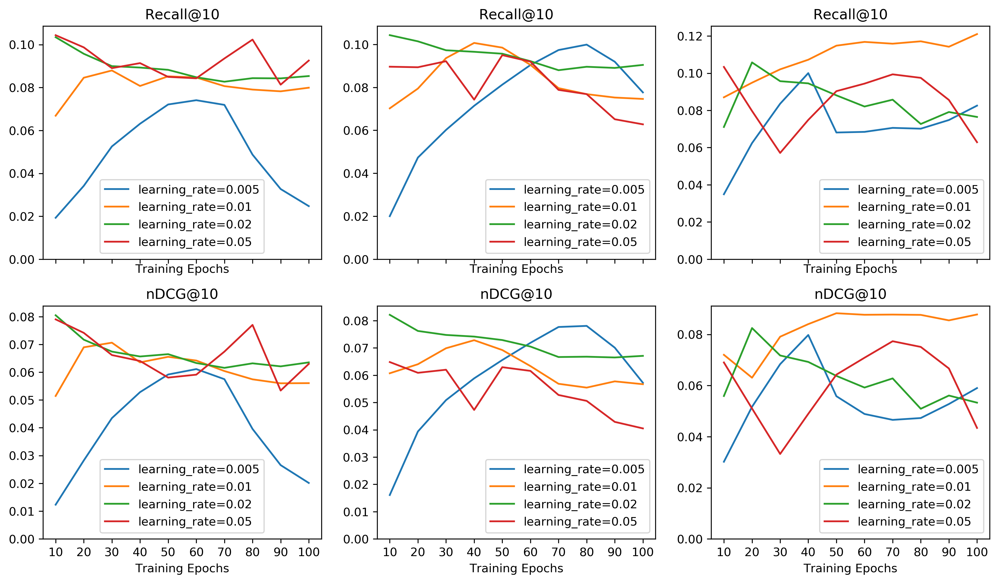

In [32]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = meetup_afm.group_evaluations["partition"]
meetup_afm_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = meetup_afm_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()
    
meetup_afm_fig.show()

### Attentional Factorization Machines with pre-trained embeddings

In [39]:
meetup_afm_pretrained = EvaluatePartition("../data/meetup/")

users: 11233, events: 6538


In [40]:
for f in [64]:
    for l in [str(l)[2:] for l in [0.005, 0.01, 0.02, 0.05]]:
        result_dir = "AFMpretrained/F{0}L{1}B256R001".format(f, l)
        with elapsed_timer("{0}s - %s" % (result_dir,)):
            for e in [str(e) for e in range(10, 100 + 1, 10)]:
                meetup_afm.add_evaluation(
                    meetup_file(os.path.join(result_dir, "AFMpretrained_F{0}L{1}B256E{2}R001.tsv".format(f, l, e))),
                    "partition", partition=e, algorithm="AFMpretrained", model_params="F{0}L{1}B256R001".format(f, l))


1035.5424981117249s - AFMpretrained/F64L005B256R001
1035.3588712215424s - AFMpretrained/F64L01B256R001
1053.2423994541168s - AFMpretrained/F64L02B256R001
1102.5811910629272s - AFMpretrained/F64L05B256R001


In [44]:
dataframe = meetup_afm.group_evaluations["partition"]
meetup_afm_pretrained.group_evaluations["partition"] = dataframe[dataframe["algorithm"] == "AFMpretrained"]

In [45]:
meetup_afm_pretrained.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
120,0.003561,0.016558,0.005861,0.017891,0.012988,0.007847,0.005428,0.003953,43.062835,0.0,0.782502,0.838483,0.908221,10,AFMpretrained,F64L005B256R001
121,0.002858,0.012558,0.004656,0.020028,0.012055,0.006116,0.004759,0.003079,47.593958,0.0,0.782502,0.838483,0.894085,20,AFMpretrained,F64L005B256R001
122,0.003116,0.014753,0.005145,0.023692,0.012785,0.007262,0.005350,0.003824,45.955332,0.0,0.782502,0.838483,0.888213,30,AFMpretrained,F64L005B256R001
123,0.003169,0.015208,0.005245,0.026596,0.014553,0.007735,0.006004,0.004170,42.863943,0.0,0.782502,0.838483,0.885505,40,AFMpretrained,F64L005B256R001
124,0.003285,0.015838,0.005441,0.034800,0.019046,0.012096,0.010989,0.009097,40.466226,0.0,0.782502,0.838330,0.882868,50,AFMpretrained,F64L005B256R001
125,0.003294,0.015868,0.005455,0.036966,0.020720,0.013725,0.012837,0.010889,38.453186,0.0,0.782502,0.838330,0.882446,60,AFMpretrained,F64L005B256R001
126,0.003312,0.015957,0.005485,0.036998,0.020937,0.013827,0.012911,0.010922,41.387823,0.0,0.782196,0.838330,0.873514,70,AFMpretrained,F64L005B256R001
127,0.003294,0.015943,0.005460,0.037655,0.020675,0.013760,0.012808,0.010830,41.383379,0.0,0.782196,0.838330,0.870947,80,AFMpretrained,F64L005B256R001
128,0.003294,0.015939,0.005459,0.037379,0.020714,0.013743,0.012820,0.010803,42.336177,0.0,0.782196,0.838330,0.868099,90,AFMpretrained,F64L005B256R001
129,0.003312,0.015957,0.005485,0.037625,0.021358,0.013946,0.013183,0.011052,43.166031,0.0,0.782196,0.838177,0.861699,100,AFMpretrained,F64L005B256R001


#### Ploting metrics

TypeError: 'NoneType' object is not subscriptable

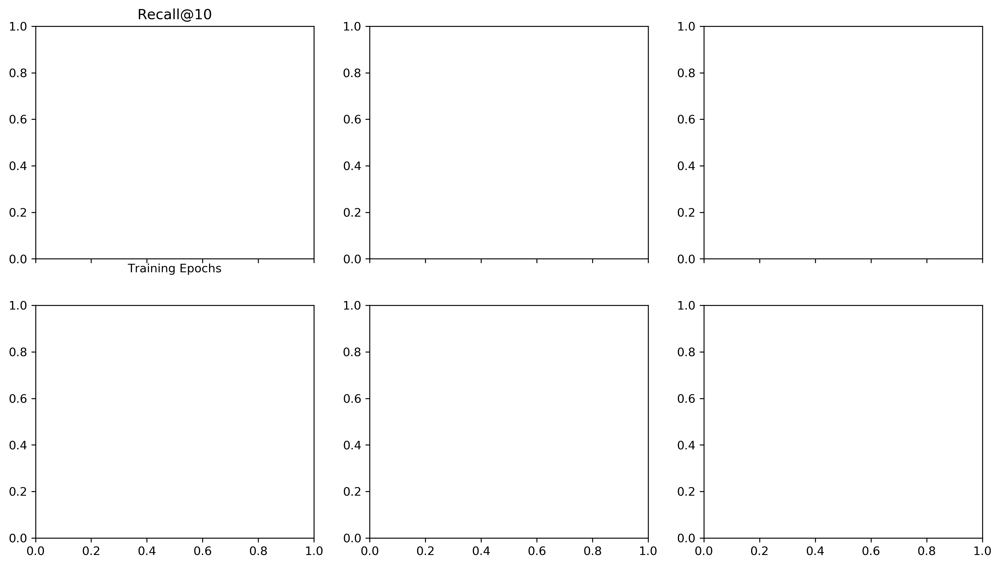

In [42]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = meetup_afm_pretrained.group_evaluations["partition"]
meetup_afm_pretrained_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = meetup_afm_pretrained_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()
    
meetup_afm_pretrained_fig.show()

## Effects of semantic embeddings

In [84]:
frappe_semantic_effects = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [85]:
for e in [str(e) for e in range(10, 100 + 1, 10)]:
    f = 256
    l = "05"
    frappe_semantic_effects.add_evaluation(
                frappe_file("SAFM/MHAFM_F256L05B256R001/MHAFM_F{0}L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="FAFM", model_params="F{0}L{1}B256R001".format(f, l))

In [87]:
for e in [str(e) for e in range(10, 100 + 1, 10)]:
    f = 256
    h = 256
    l = "05"
    frappe_semantic_effects.add_evaluation(
                frappe_file("SAFM/MHAFM_F256H256L05B256R001/MHAFM_F{0}L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="FAFM", model_params="F{0}H{1}L{2}B256R001".format(f, h, l))

In [90]:
for e in [str(e) for e in range(10, 100 + 1, 10)]:
    f = 256
    h = 256
    l = "05"
    frappe_semantic_effects.add_evaluation(
                frappe_file("SAFMsp/SAFMns_F256H256L05B256R001/SAFMns_F{0}H{1}L{2}B256E{3}R001.tsv".format(f, h, l, e)),
                "partition", partition=e, algorithm="SAFMns", model_params="F{0}H{1}L{2}B256R001".format(f, h, l))

In [97]:
frappe_semantic_effects.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.000797,0.007972,0.001449,0.017449,0.007369,0.003318,0.003019,0.001937,50.799599,0.0,1.0,1.0,0.852672,10,FAFM,F256L05B256R001
1,0.000266,0.002657,0.000483,0.006910,0.002324,0.001238,0.001094,0.000813,63.486034,0.0,1.0,1.0,0.894302,20,FAFM,F256L05B256R001
2,0.000325,0.003248,0.000590,0.007610,0.002677,0.001453,0.001234,0.000923,61.271903,0.0,1.0,1.0,0.902273,30,FAFM,F256L05B256R001
3,0.000295,0.002952,0.000537,0.008035,0.002523,0.001234,0.001073,0.000748,58.903537,0.0,1.0,1.0,0.908178,40,FAFM,F256L05B256R001
4,0.000266,0.002657,0.000483,0.009071,0.002430,0.001115,0.001019,0.000673,61.754950,0.0,1.0,1.0,0.880720,50,FAFM,F256L05B256R001
5,0.000325,0.003248,0.000590,0.007166,0.002460,0.001433,0.001171,0.000899,62.321192,0.0,1.0,1.0,0.910836,60,FAFM,F256L05B256R001
6,0.000413,0.004133,0.000752,0.007073,0.002742,0.001648,0.001224,0.000938,61.468647,0.0,1.0,1.0,0.910540,70,FAFM,F256L05B256R001
7,0.000384,0.003838,0.000698,0.006663,0.002695,0.001324,0.000968,0.000616,59.824138,0.0,1.0,1.0,0.914379,80,FAFM,F256L05B256R001
8,0.000413,0.004133,0.000752,0.007524,0.002906,0.001820,0.001415,0.001136,59.608280,0.0,1.0,1.0,0.907293,90,FAFM,F256L05B256R001
9,0.000472,0.004724,0.000859,0.008713,0.004001,0.001881,0.001624,0.001065,53.068345,0.0,1.0,1.0,0.917921,100,FAFM,F256L05B256R001


## Influence of sharing

### Sharing nothing

In [8]:
frappe_sharing_nothing = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [11]:
for f in [64, 128, 256]:
    for l in [str(l)[2:] for l in [0.005, 0.01, 0.02, 0.05]]:
        for e in [str(e) for e in range(10, 100 + 1, 10)]:
            frappe_sharing_nothing.add_evaluation(
                frappe_file("SAFMsp/shared-nothing/F{0}L{1}B256R001/SAFMsn_F{0}H256L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="SAFMsn", model_params="F{0}H256L{1}B256R001".format(f, l))

In [12]:
frappe_sharing_nothing.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.002539,0.025391,0.004617,0.024719,0.014575,0.010976,0.007578,0.006581,49.058626,0.0,1.0,1.0,0.823738,10,SAFMsn,F64H256L005B256R001
1,0.004694,0.046944,0.008535,0.050980,0.033344,0.019567,0.015277,0.011513,42.302545,0.0,1.0,1.0,0.686743,20,SAFMsn,F64H256L005B256R001
2,0.004872,0.048716,0.008857,0.051380,0.029926,0.018142,0.012508,0.009280,44.498291,0.0,1.0,1.0,0.654562,30,SAFMsn,F64H256L005B256R001
3,0.000561,0.005610,0.001020,0.027280,0.006920,0.002702,0.002950,0.001850,58.058769,0.0,1.0,1.0,0.683496,40,SAFMsn,F64H256L005B256R001
4,0.000502,0.005019,0.000913,0.026210,0.004179,0.001713,0.001414,0.000776,60.044118,0.0,1.0,1.0,0.638618,50,SAFMsn,F64H256L005B256R001
5,0.002716,0.027163,0.004939,0.056199,0.023301,0.009182,0.007973,0.004135,47.339547,0.0,1.0,1.0,0.556540,60,SAFMsn,F64H256L005B256R001
6,0.005285,0.052849,0.009609,0.081693,0.043047,0.018338,0.015258,0.008552,37.242125,0.0,1.0,1.0,0.521996,70,SAFMsn,F64H256L005B256R001
7,0.007529,0.075288,0.013689,0.091374,0.051684,0.027947,0.020563,0.014206,36.389474,0.0,1.0,1.0,0.495128,80,SAFMsn,F64H256L005B256R001
8,0.006112,0.061116,0.011112,0.091643,0.051111,0.022242,0.018841,0.011120,36.626131,0.0,1.0,1.0,0.478004,90,SAFMsn,F64H256L005B256R001
9,0.002952,0.029525,0.005368,0.078451,0.029410,0.011652,0.011172,0.006418,41.425991,0.0,1.0,1.0,0.493357,100,SAFMsn,F64H256L005B256R001


#### Ploting metrics

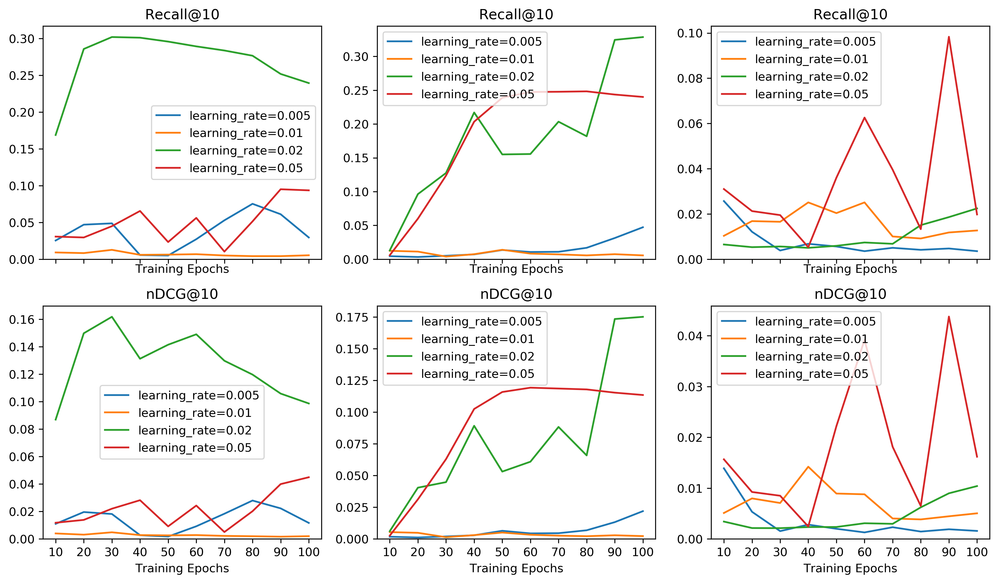

In [13]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_sharing_nothing.group_evaluations["partition"]
frappe_sharing_nothing_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_sharing_nothing_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}H256L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}H256L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()
    
frappe_sharing_nothing_fig.show()

In [14]:
frappe_sharing_nothing.group_evaluations["partition"].loc[
    frappe_sharing_nothing.group_evaluations["partition"]["model_params"] == "F128H256L02B256R001", :]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
60,0.001299,0.012991,0.002362,0.013769,0.009147,0.006102,0.004842,0.004054,44.359862,0.0,1.0,1.0,0.914674,10,SAFMsn,F128H256L02B256R001
61,0.009625,0.096250,0.017500,0.077321,0.057517,0.040412,0.028628,0.023648,29.939781,0.0,1.0,1.0,0.676410,20,SAFMsn,F128H256L02B256R001
62,0.012755,0.127547,0.023190,0.095686,0.075415,0.044785,0.029794,0.021301,28.137931,0.0,1.0,1.0,0.571893,30,SAFMsn,F128H256L02B256R001
63,0.021701,0.217006,0.039456,0.138822,0.121934,0.089209,0.061267,0.051907,23.229203,0.0,1.0,1.0,0.492471,40,SAFMsn,F128H256L02B256R001
64,0.015500,0.155004,0.028183,0.119262,0.094837,0.053103,0.035509,0.024132,25.466327,0.0,1.0,1.0,0.478299,50,SAFMsn,F128H256L02B256R001
65,0.015559,0.155595,0.028290,0.129181,0.099631,0.060891,0.043841,0.033333,25.684327,0.0,1.0,1.0,0.465013,60,SAFMsn,F128H256L02B256R001
66,0.020342,0.203425,0.036986,0.150084,0.126738,0.088313,0.064225,0.053416,23.134377,0.0,1.0,1.0,0.452908,70,SAFMsn,F128H256L02B256R001
67,0.018187,0.181872,0.033068,0.132016,0.106681,0.065868,0.043466,0.032166,26.536217,0.0,1.0,1.0,0.433422,80,SAFMsn,F128H256L02B256R001
68,0.032448,0.324476,0.058996,0.210312,0.189216,0.173453,0.131638,0.127305,20.802665,0.0,1.0,1.0,0.423974,90,SAFMsn,F128H256L02B256R001
69,0.032861,0.328609,0.059747,0.212355,0.190885,0.175176,0.132626,0.128298,20.342668,0.0,1.0,1.0,0.420136,100,SAFMsn,F128H256L02B256R001


### Shared  Input Projection

In [17]:
frappe_shared_input_projection = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [18]:
import time

for f in [64, 128, 256]:
    for l in [str(l)[2:] for l in [0.005, 0.01, 0.02, 0.05]]:
        result_dir = "SAFMsp/shared-input-projection/F{0}L{1}B256R001".format(f, l)
        begin_time = time.time()
        for e in [str(e) for e in range(10, 100 + 1, 10)]:
            frappe_shared_input_projection.add_evaluation(
                frappe_file(os.path.join(result_dir, "SAFMip_F{0}H256L{1}B256E{2}R001.tsv".format(f, l, e))),
                "partition", partition=e, algorithm="SAFMip", model_params="F{0}H256L{1}B256R001".format(f, l))
        LOGGER.critical("[%fs] Evaluated %s", time.time() - begin_time, result_dir)

[310.863412s] Evaluated SAFMsp/shared-input-projection/F64L005B256R001
[307.064898s] Evaluated SAFMsp/shared-input-projection/F64L01B256R001
[304.829661s] Evaluated SAFMsp/shared-input-projection/F64L02B256R001
[306.600915s] Evaluated SAFMsp/shared-input-projection/F64L05B256R001
[306.499320s] Evaluated SAFMsp/shared-input-projection/F128L005B256R001
[305.287483s] Evaluated SAFMsp/shared-input-projection/F128L01B256R001
[304.305697s] Evaluated SAFMsp/shared-input-projection/F128L02B256R001
[304.092688s] Evaluated SAFMsp/shared-input-projection/F128L05B256R001
[304.695843s] Evaluated SAFMsp/shared-input-projection/F256L005B256R001
[306.749235s] Evaluated SAFMsp/shared-input-projection/F256L01B256R001
[306.732176s] Evaluated SAFMsp/shared-input-projection/F256L02B256R001
[305.190110s] Evaluated SAFMsp/shared-input-projection/F256L05B256R001


In [19]:
frappe_shared_input_projection.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.001358,0.013581,0.002469,0.027594,0.011440,0.005471,0.004690,0.003091,49.421622,0.0,1.0,1.0,0.781518,10,SAFMip,F64H256L005B256R001
1,0.000472,0.004724,0.000859,0.011755,0.004577,0.001960,0.001825,0.001144,57.816372,0.0,1.0,1.0,0.866549,20,SAFMip,F64H256L005B256R001
2,0.000236,0.002362,0.000429,0.013964,0.002919,0.000755,0.000864,0.000309,63.242537,0.0,1.0,1.0,0.762622,30,SAFMip,F64H256L005B256R001
3,0.000413,0.004133,0.000752,0.014674,0.004168,0.001687,0.001616,0.000964,62.253333,0.0,1.0,1.0,0.778565,40,SAFMip,F64H256L005B256R001
4,0.000325,0.003248,0.000590,0.012649,0.003368,0.001132,0.001139,0.000527,66.342205,0.0,1.0,1.0,0.767050,50,SAFMip,F64H256L005B256R001
5,0.000384,0.003838,0.000698,0.011872,0.003700,0.001393,0.001320,0.000691,65.086614,0.0,1.0,1.0,0.775022,60,SAFMip,F64H256L005B256R001
6,0.000354,0.003543,0.000644,0.009935,0.002823,0.001143,0.000912,0.000472,64.115970,0.0,1.0,1.0,0.844700,70,SAFMip,F64H256L005B256R001
7,0.000561,0.005610,0.001020,0.011253,0.003856,0.001981,0.001461,0.000941,61.762452,0.0,1.0,1.0,0.845881,80,SAFMip,F64H256L005B256R001
8,0.000354,0.003543,0.000644,0.009551,0.003529,0.001613,0.001537,0.001025,65.818526,0.0,1.0,1.0,0.843815,90,SAFMip,F64H256L005B256R001
9,0.000561,0.005610,0.001020,0.010424,0.003700,0.001959,0.001361,0.000911,64.791444,0.0,1.0,1.0,0.834367,100,SAFMip,F64H256L005B256R001


#### Ploting metrics

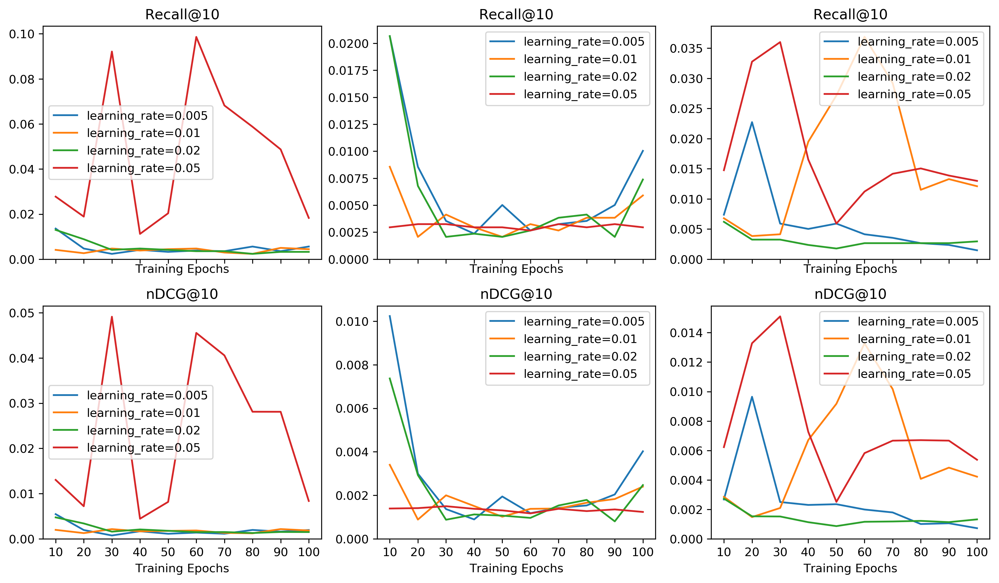

In [20]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_shared_input_projection.group_evaluations["partition"]
frappe_shared_input_projection_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_shared_input_projection_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}H256L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}H256L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()
    
frappe_shared_input_projection_fig.show()

### Shared Attention

#### Frappe dataset

In [104]:
frappe_shared_attention = EvaluatePartition("../partitioned_data/frappe/partition_1/")

In [105]:
for f in [64, 256]:
    for l in [str(l)[2:] for l in [0.05]]:
        for e in [str(e) for e in range(10, 100 + 1, 10)]:
            frappe_shared_attention.add_evaluation(
                frappe_file("SAFMsp/SAFMsatt_F{0}L{1}B256R001/SAFMsatt_F{0}H256L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="SAFMsatt", model_params="F{0}H256L{1}B256R001".format(f, l))

In [106]:
frappe_shared_attention.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.001742,0.017420,0.003167,0.018451,0.011810,0.007440,0.005662,0.004480,48.325942,0.0,1.0,1.0,0.866844,10,SAFMsatt,F64H256L05B256R001
1,0.001476,0.014762,0.002684,0.023169,0.010970,0.007140,0.005828,0.004804,53.032401,0.0,1.0,1.0,0.799528,20,SAFMsatt,F64H256L05B256R001
2,0.003100,0.031001,0.005637,0.043542,0.027567,0.010598,0.009476,0.004891,40.055195,0.0,1.0,1.0,0.727192,30,SAFMsatt,F64H256L05B256R001
3,0.001329,0.013286,0.002416,0.016291,0.009004,0.006153,0.004748,0.003996,55.977316,0.0,1.0,1.0,0.843815,40,SAFMsatt,F64H256L05B256R001
4,0.004281,0.042811,0.007784,0.043382,0.025546,0.015737,0.010521,0.007892,46.935226,0.0,1.0,1.0,0.667257,50,SAFMsatt,F64H256L05B256R001
5,0.018955,0.189548,0.034463,0.126000,0.103907,0.095839,0.069724,0.067464,30.158762,0.0,1.0,1.0,0.551816,60,SAFMsatt,F64H256L05B256R001
6,0.021081,0.210806,0.038328,0.123338,0.104419,0.096050,0.063618,0.061356,27.629431,0.0,1.0,1.0,0.558606,70,SAFMsatt,F64H256L05B256R001
7,0.001506,0.015058,0.002738,0.019592,0.009552,0.007118,0.005366,0.004713,49.331942,0.0,1.0,1.0,0.858577,80,SAFMsatt,F64H256L05B256R001
8,0.017242,0.172424,0.031350,0.105827,0.090972,0.083578,0.058397,0.056369,33.641738,0.0,1.0,1.0,0.585474,90,SAFMsatt,F64H256L05B256R001
9,0.006732,0.067316,0.012239,0.051422,0.039352,0.029034,0.020390,0.017550,35.591294,0.0,1.0,1.0,0.755831,100,SAFMsatt,F64H256L05B256R001


#### Plotting metrics for Frappe results

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = frappe_shared_attention.group_evaluations["partition"]
frappe_shared_attention_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = frappe_shared_attention_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}H256L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}H256L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()
    
frappe_shared_attention_fig.show()

#### Meetup dataset

In [46]:
meetup_shared_attention = EvaluatePartition("../data/meetup/")

users: 11233, events: 6538


In [ ]:
for f in [64, 128, 256]:
    for l in [str(l)[2:] for l in [0.005, 0.01, 0.02, 0.05]]:
        result_dir = "SAFMmp/SAFMsatt/F{0}H256L{1}B256R001".format(f, l)
        with elapsed_timer("{0}s - %s" % (result_dir,)):
            for e in [str(e) for e in range(10, 100 + 1, 10)]:
                meetup_shared_attention.add_evaluation(
                    meetup_file(os.path.join(result_dir, "SAFMsatt_F{0}H256L{1}B256E{2}R001.tsv".format(f, l, e))),
                    "partition", partition=e, algorithm="SAFMsatt", model_params="F{0}H256L{1}B256R001".format(f, l))


In [48]:
meetup_shared_attention.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.000516,0.002687,0.000866,0.003147,0.001758,0.001309,0.000765,0.000650,53.775000,0.0,0.782961,0.839095,0.981715,10,SAFMsatt,F64H256L005B256R001
1,0.000926,0.003928,0.001498,0.006729,0.003733,0.001819,0.001232,0.000766,49.580400,0.0,0.782043,0.838330,0.963042,20,SAFMsatt,F64H256L005B256R001
2,0.002697,0.013460,0.004494,0.019260,0.012133,0.007011,0.004890,0.003616,40.643594,0.0,0.782043,0.838789,0.928370,30,SAFMsatt,F64H256L005B256R001
3,0.003650,0.018887,0.006118,0.023630,0.015423,0.011010,0.007798,0.006721,39.660611,0.0,0.782502,0.838942,0.914832,40,SAFMsatt,F64H256L005B256R001
4,0.003481,0.017442,0.005803,0.020396,0.013207,0.009651,0.006429,0.005492,46.565795,0.0,0.782502,0.839095,0.909944,50,SAFMsatt,F64H256L005B256R001
5,0.003597,0.016868,0.005929,0.018286,0.012238,0.008937,0.005848,0.004837,43.921053,0.0,0.782349,0.838942,0.921162,60,SAFMsatt,F64H256L005B256R001
6,0.003196,0.014242,0.005220,0.020069,0.011462,0.007450,0.005140,0.003979,43.421814,0.0,0.782196,0.838789,0.910050,70,SAFMsatt,F64H256L005B256R001
7,0.002697,0.012009,0.004405,0.021719,0.011178,0.006706,0.005093,0.003826,46.515010,0.0,0.782502,0.839095,0.894578,80,SAFMsatt,F64H256L005B256R001
8,0.002680,0.012200,0.004394,0.020880,0.011741,0.007051,0.005511,0.004258,46.167554,0.0,0.782502,0.838942,0.900942,90,SAFMsatt,F64H256L005B256R001
9,0.002706,0.012376,0.004441,0.022672,0.012910,0.007503,0.006086,0.004671,45.117667,0.0,0.782502,0.838942,0.898692,100,SAFMsatt,F64H256L005B256R001


#### Plotting metrics for Meetup results

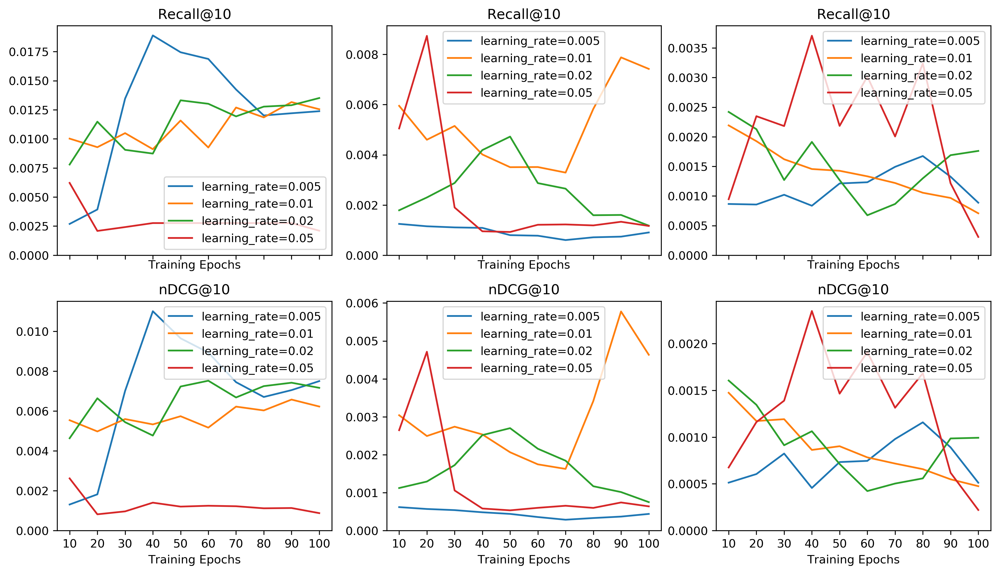

In [49]:
%matplotlib inline
import matplotlib.pyplot as plt

dataframe = meetup_shared_attention.group_evaluations["partition"]
meetup_shared_attention_fig = plt.figure(figsize=[14.4, 8.0], dpi=300)
ax_recall_ndcg = meetup_shared_attention_fig.subplots(nrows=2, ncols=3, sharex="col")

for axes_j, embedding_size in enumerate([64, 128, 256]):
    ax_recall_ndcg[0, axes_j].set_title("Recall@10")
    ax_recall_ndcg[0, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}H256L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[0, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "recall_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[0, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[0, axes_j].legend()

    ax_recall_ndcg[1, axes_j].set_title("nDCG@10")
    ax_recall_ndcg[1, axes_j].set_xlabel("Training Epochs")
    for learning_rate in [0.005, 0.01, 0.02, 0.05]:
        index = dataframe["model_params"] == "F{0}H256L{1}B256R001".format(embedding_size, str(learning_rate)[2:])
        ax_recall_ndcg[1, axes_j].plot(dataframe.loc[index, "partition"],
                                       dataframe.loc[index, "ndcg_at_10"],
                                       label="learning_rate={0}".format(str(learning_rate)))
    ax_recall_ndcg[1, axes_j].set_ylim(bottom=0.0)
    ax_recall_ndcg[1, axes_j].legend()
    
meetup_shared_attention_fig.show()

### Shared FeedForward

In [107]:
frappe_shared_feedforward = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [108]:
for f in [64, 256]:
    for l in [str(l)[2:] for l in [0.05]]:
        for e in [str(e) for e in range(10, 100 + 1, 10)]:
            frappe_shared_feedforward.add_evaluation(
                frappe_file("SAFMsp/SAFMsf_F{0}L{1}B256R001/SAFMsf_F{0}H256L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="SAFMsf", model_params="F{0}H256L{1}B256R001".format(f, l))

In [109]:
frappe_shared_feedforward.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.002687,0.026867,0.004885,0.088817,0.018414,0.010195,0.007700,0.005438,42.179260,0.0,1.0,1.0,0.433422,10,SAFMsf,F64H256L05B256R001
1,0.000768,0.007676,0.001396,0.061040,0.005574,0.004351,0.003692,0.003380,50.587432,0.0,1.0,1.0,0.459699,20,SAFMsf,F64H256L05B256R001
2,0.000413,0.004133,0.000752,0.049152,0.004758,0.001776,0.001859,0.001081,53.825328,0.0,1.0,1.0,0.459108,30,SAFMsf,F64H256L05B256R001
3,0.000620,0.006200,0.001127,0.015962,0.005120,0.002855,0.002471,0.001875,70.589606,0.0,1.0,1.0,0.505757,40,SAFMsf,F64H256L05B256R001
4,0.000768,0.007676,0.001396,0.012750,0.007083,0.005076,0.004866,0.004320,76.200000,0.0,1.0,1.0,0.570416,50,SAFMsf,F64H256L05B256R001
5,0.000502,0.005019,0.000913,0.013933,0.005094,0.002075,0.002050,0.001243,70.177312,0.0,1.0,1.0,0.690286,60,SAFMsf,F64H256L05B256R001
6,0.000738,0.007381,0.001342,0.013109,0.005108,0.002890,0.002155,0.001558,71.081034,0.0,1.0,1.0,0.657514,70,SAFMsf,F64H256L05B256R001
7,0.000384,0.003838,0.000698,0.013600,0.004203,0.001972,0.001957,0.001388,68.108265,0.0,1.0,1.0,0.746383,80,SAFMsf,F64H256L05B256R001
8,0.000354,0.003543,0.000644,0.010674,0.003525,0.001769,0.001689,0.001226,68.959441,0.0,1.0,1.0,0.788899,90,SAFMsf,F64H256L05B256R001
9,0.000502,0.005019,0.000913,0.017200,0.006460,0.002439,0.002738,0.001679,63.671362,0.0,1.0,1.0,0.748450,100,SAFMsf,F64H256L05B256R001


### Shared All

In [110]:
frappe_shared_all = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [111]:
for f in [64, 256]:
    for l in [str(l)[2:] for l in [0.05]]:
        for e in [str(e) for e in range(10, 100 + 1, 10)]:
            frappe_shared_all.add_evaluation(
                frappe_file("SAFMsp/SAFMsall_F{0}L{1}B256R001/SAFMsall_F{0}H256L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="SAFMsall", model_params="F{0}H256L{1}B256R001".format(f, l))

In [112]:
frappe_shared_all.group_evaluations["partition"]

,precision_at_10,recall_at_10,f1_score_at_10,ndcg_at_50,ndcg_at_20,ndcg_at_10,map_at_20,map_at_10,mean_ranks,user_coverage,event_coverage_at_10,event_coverage_at_20,perc_user_events_rank_NA,partition,algorithm,model_params
0,0.003602,0.036020,0.006549,0.034539,0.021900,0.015650,0.011379,0.009636,45.753989,0.0,1.0,1.0,0.777975,10,SAFMsall,F64H256L05B256R001
1,0.001181,0.011810,0.002147,0.017353,0.009841,0.004729,0.004024,0.002640,52.953096,0.0,1.0,1.0,0.842634,20,SAFMsall,F64H256L05B256R001
2,0.002244,0.022439,0.004080,0.036012,0.017246,0.009644,0.007951,0.005907,46.752941,0.0,1.0,1.0,0.749040,30,SAFMsall,F64H256L05B256R001
3,0.009271,0.092707,0.016856,0.068594,0.051419,0.042090,0.029508,0.026986,38.138326,0.0,1.0,1.0,0.664895,40,SAFMsall,F64H256L05B256R001
4,0.004222,0.042220,0.007676,0.031842,0.022460,0.017661,0.011763,0.010436,41.807882,0.0,1.0,1.0,0.820195,50,SAFMsall,F64H256L05B256R001
5,0.005019,0.050192,0.009126,0.044882,0.030465,0.024635,0.018482,0.016915,44.762655,0.0,1.0,1.0,0.737526,60,SAFMsall,F64H256L05B256R001
6,0.002657,0.026572,0.004831,0.031424,0.018445,0.013366,0.010849,0.009454,50.873275,0.0,1.0,1.0,0.764689,70,SAFMsall,F64H256L05B256R001
7,0.001004,0.010038,0.001825,0.014475,0.007350,0.004255,0.003377,0.002547,52.029851,0.0,1.0,1.0,0.881311,80,SAFMsall,F64H256L05B256R001
8,0.001329,0.013286,0.002416,0.017273,0.009214,0.006140,0.004821,0.004008,53.194332,0.0,1.0,1.0,0.854148,90,SAFMsall,F64H256L05B256R001
9,0.001919,0.019191,0.003489,0.022496,0.012842,0.008098,0.006090,0.004804,49.949410,0.0,1.0,1.0,0.824919,100,SAFMsall,F64H256L05B256R001


### Final selected results

In [22]:
frappe_sharing_influence = EvaluatePartition("../partitioned_data/frappe/partition_1/")

users: 3387, events: 856


In [ ]:
with elapsed_timer("{0}s - Add Evaluation of Shared All"):
    frappe_sharing_influence.add_evaluation(
        frappe_file("SAFMsp/shared-all/F64L04B256R001/SAFMsall_F64H256L05B256E40R001.tsv"),
        "partition", partition=40, algorithm="SAFMsall", model_params="F{0}H256L{1}B256R001".format(f, l))
frappe_sharing_influence.add_evaluation(
                frappe_file("SAFMsp/SAFMsall_F{0}L{1}B256R001/SAFMsall_F{0}H256L{1}B256E{2}R001.tsv".format(f, l, e)),
                "partition", partition=e, algorithm="SAFMsall", model_params="F{0}H256L{1}B256R001".format(f, l))